In [1]:
#Library Used in all Code
import numpy as np
import pandas as pd

#Used In Rule of Mixtures
import pymatgen as pymat
import mendeleev as mendel

#Random
np.random.seed(44) # Random Seed1
import random

# PLOTTING (MATPLOTLIB)
%matplotlib inline
import matplotlib.animation as animation
from IPython.display import HTML

# PLOTTING (PLOTLY)
import plotly 
import plotly.graph_objs as go
from plotly.offline import iplot
plotly.offline.init_notebook_mode(connected=True)

# ML
from lolopy.learners import RandomForestRegressor

# Meltheas TOOL
from simtool import findInstalledSimToolNotebooks, searchForSimTool
from simtool import getSimToolInputs, getSimToolOutputs, Run

MeltHEA = searchForSimTool('meltheas')
from IPython.display import clear_output
from IPython.display import display
from hublib.ui import FileUpload
import ipywidgets as widgets
import os
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

<IPython.core.display.Javascript object>

# Import Initial Dataset 

In [2]:
#Get initial set for testing data
initial_data = pd.read_csv('NewSmallCompistionDataSet.csv')
initial_data = initial_data.drop(['Solid Tm'], axis=1)
initial_data = initial_data.drop(['Liquid Tm'], axis=1)
initial_data = initial_data.drop(['Minus'], axis=1)
initial_data = initial_data.drop(['Plus'], axis=1)
initial_data = initial_data.drop(['Unnamed: 0'], axis=1)
compared_df = initial_data.drop(['Simulated Tm'], axis=1)
#display(initial_data)

# All Plausible Compisition Creator

In [3]:
#Create lines to get values with .1 step size
nx = 11
x1 = np.linspace(0, 1, nx)
y, y1, y2, y3, y4 = np.meshgrid(x1, x1, x1, x1, x1)
positions = np.vstack([y.ravel(), y1.ravel(), y2.ravel(), y3.ravel(), y4.ravel()]).T

#Make dataframe with limits of all possible compistions combinations
all_permutations = pd.DataFrame(positions)
all_permutations["sum"]= all_permutations.sum(axis = 1)
plausible_compositions = all_permutations[all_permutations["sum"] == 1]

plausible_compositions = plausible_compositions[plausible_compositions[0] <= 0.5]
plausible_compositions = plausible_compositions[plausible_compositions[1] <= 0.5]
plausible_compositions = plausible_compositions[plausible_compositions[2] <= 0.5]
plausible_compositions = plausible_compositions[plausible_compositions[3] <= 0.5]
plausible_compositions = plausible_compositions[plausible_compositions[4] <= 0.5]

plausible_compositions = plausible_compositions.round(1)

plausible_compositions = plausible_compositions.drop(["sum"], axis = 1)
initial_plausible_compositions = plausible_compositions
#display(plausible_compositions)

# Apply Rule of Mixtures to Compositions

In [4]:
#string to select characteristics
actual_qued_values = ['youngs_modulus', 'atomic_radius', 'electrical_resistivity','CTE','hardness','boiling_point',
                         'atomic_mass','poissons_ratio','density_of_solid','en_gosh','melting_point']

sample = ['Cr', 'Co', 'Cu', 'Fe', 'Ni']

def get_discriptors(input_string,sample):
    #dictionary values to choose from
    string_dict = ['bulk_modulus','youngs_modulus','CTE','thermal_conductivity','boiling_point','critical_temperature',
                  'vdw_radius','average_ionic_radius','atomic_radius','atomic_number','atomic_mass','molar_volume', 
                   'density_of_solid','hardness','poissons_ratio','period','group','en_gosh','electrical_resistivity', 'melting_point']

    #Creation of dictionary
    data_set = {}

    #Make dict of lists
    for length_string in range(len(string_dict)):
        data_set[string_dict[length_string]] = []

    #all plausbile compositions from before
    df2 = plausible_compositions

    #list of all things
    que_values = []

    for item in sample:
        element_object = pymat.Element(item)
        data_set[string_dict[0]].append(element_object.bulk_modulus) #bulk_modulus
        data_set[string_dict[1]].append(element_object.youngs_modulus) #youngs_modulus
        data_set[string_dict[2]].append(element_object.coefficient_of_linear_thermal_expansion) #CTE
        data_set[string_dict[3]].append(element_object.thermal_conductivity) #thermal conductivity
        data_set[string_dict[4]].append(element_object.boiling_point) #boiling_point
        data_set[string_dict[5]].append(element_object.critical_temperature) #critical temperature
        data_set[string_dict[6]].append(element_object.van_der_waals_radius) #vander wall radius
        data_set[string_dict[7]].append(element_object.average_ionic_radius) #average ionic radius
        data_set[string_dict[8]].append(element_object.atomic_radius) #atomic radius
        data_set[string_dict[9]].append(element_object.Z) #atomic number
        data_set[string_dict[10]].append(element_object.atomic_mass) #atomic mass
        data_set[string_dict[11]].append(element_object.molar_volume) #molar volume
        data_set[string_dict[12]].append(element_object.density_of_solid) #density_solid
        data_set[string_dict[13]].append(element_object.brinell_hardness) #brinell_hardness
        data_set[string_dict[14]].append(element_object.poissons_ratio) #poissons_ratio
        data_set[string_dict[15]].append(element_object.row) #period
        data_set[string_dict[16]].append(element_object.group) #group
        data_set[string_dict[17]].append(element_object.X) #en_gosh
        data_set[string_dict[18]].append(element_object.electrical_resistivity) #electrical_resistivity
        data_set[string_dict[19]].append(element_object.melting_point) #melting_point

    for discript in input_string:
        que_values.append(data_set[discript])

    df = pd.DataFrame(data = que_values, columns = sample, index = input_string) 
    display(df)
    return df

discriptors_df = get_discriptors(actual_qued_values,sample)

,Cr,Co,Cu,Fe,Ni
youngs_modulus,2.790000e+02,2.090000e+02,1.300000e+02,2.110000e+02,2.000000e+02
atomic_radius,1.400000e+00,1.350000e+00,1.350000e+00,1.400000e+00,1.350000e+00
electrical_resistivity,1.270000e-07,6.000000e-08,1.720000e-08,1.000000e-07,7.200000e-08
CTE,4.900000e-06,1.300000e-05,1.650000e-05,1.180000e-05,1.340000e-05
hardness,1.120000e+03,7.000000e+02,8.740000e+02,4.900000e+02,7.000000e+02
boiling_point,2.944000e+03,3.200000e+03,3.200000e+03,3.134000e+03,3.186000e+03
atomic_mass,5.199610e+01,5.893319e+01,6.354600e+01,5.584500e+01,5.869340e+01
poissons_ratio,2.100000e-01,3.100000e-01,3.400000e-01,2.900000e-01,3.100000e-01
density_of_solid,7.140000e+03,8.900000e+03,8.920000e+03,7.874000e+03,8.908000e+03
en_gosh,1.660000e+00,1.880000e+00,1.900000e+00,1.830000e+00,1.910000e+00


In [ ]:
#Rename df to match other dataframes
plausible_compositions = plausible_compositions.rename(columns = {0:'Cr',1:'Co',2:'Cu',3:'Fe', 4:'Ni'})

#Taking out replicas
df = pd.merge(plausible_compositions, compared_df, how='left', indicator = 'Exsist')
df = df[df['Exsist'] != 'both']
plausible_compositions = df.drop(['Exsist'], axis = 1)

#display(plausible_compositions)

# Applying Rule of Mixture

In [ ]:
#Applu Rule of Mixtures
def rule_mixtures(df2,df,sample): 
    #Creator column of first rule mixture discriptor to concat to
    cr = 0
    for comps in sample:
        cr = cr+df2[comps]*df[comps][0]
    cr = cr.to_frame()

    #Concat rest of compistions with rule of mixtures applied
    for x in range(1,len(actual_qued_values)):
        cf = 0
        for comps in sample:
            cf = cf + df2[comps]*df[comps][x]
        cf.to_frame()
        cr = pd.concat([cr,cf], axis=1)

    #Renames columns to discriptors
    cr.columns = actual_qued_values
    return cr

plausible_compositions_rule_mixtures = rule_mixtures(plausible_compositions,discriptors_df,sample)
known_compositions_rule_mixtures = rule_mixtures(compared_df,discriptors_df,sample)
#display(plausible_compositions_rule_mixtures)

# Data Preperation

In [ ]:
#Concatinate values
all_rule_mixtures = pd.concat([known_compositions_rule_mixtures,plausible_compositions_rule_mixtures])
all_compositions = pd.concat([compared_df,plausible_compositions])

#Experimental melting temperatures [K]
T_m_Cr = 2180
T_m_Co = 1768
T_m_Cu = 1358
T_m_Fe = 1811
T_m_Ni = 1728

#display(all_compositions)

In [ ]:
#Set testing and training data
all_values = all_rule_mixtures.values.tolist()
all_labels = initial_data['Simulated Tm'].tolist()

# List of lists are turned into Numpy arrays to facilitate calculations in steps to follow (Normalization).
all_values = np.array(all_values, dtype = float)
all_labels = np.array(all_labels, dtype = float)

create_label = np.zeros((plausible_compositions_rule_mixtures.shape[0],), dtype = int)
all_labels = np.concatenate((all_labels,create_label), axis = 0)
#display(all_compositions)

# Getting CSVS for Sequential Learning

In [ ]:
import glob
import os
import os.path, time

list_seq_learn = []

#path = '/home/nanohub/dfarache/Random_Active_Learn/Untitled Folder/'
path = os.getcwd()

print(path)

list_of_files = sorted(os.listdir(path), key=os.path.getctime)
for docs in list_of_files:
    if 'melting_8labels' in docs:
        list_seq_learn.append(docs)
print(list_seq_learn)

/home/nanohub/dfarache/Random_Active_Learn/Untitled Folder/MLI_datasetCreatorForPaper
['MLI_melting_8labels50pico0.csv', 'MLI_melting_8labels50pico1.csv', 'MLI_melting_8labels50pico2.csv', 'MLI_melting_8labels50pico3.csv', 'MLI_melting_8labels50pico4.csv']


# Random Forest Creation and Prediction

In [ ]:
X = all_values.copy() #discriptors
y = all_labels.copy() #all labels  

# assign values
model = RandomForestRegressor(num_trees = 350) #model if iterate through
#print(model.__init__)

entry_number_init = initial_data.shape[0] #starting point of initial data
in_train = np.zeros(len(X), dtype=np.bool) #make all false

in_train[:entry_number_init] = True #turns false to true 

#in_train[np.where(y!=0)] = True

print('Picked {} training entries'.format(in_train.sum()))

nsamples = in_train.sum()
train_fraction = 0.8
train_idx = int(train_fraction*nsamples)

print (X.shape, y.shape)


#Get previous runs of sequential and use them
if list_seq_learn:
    y_counter = 0
    seq_learn_data = pd.read_csv(list_seq_learn[-1])
    for val in seq_learn_data['Index']:
        in_train[val] = True
        y[val] = seq_learn_data['Simulated Tm'][y_counter]
        y_counter = y_counter + 1
    
    

# Uncomment the line below to shuffle the dataset (we do not do this here to ensure consistent results for every run)
#order = np.argsort(np.random.random(all_labels.shape)) # This numpy argsort returns the indexes that would be used to shuffle a list
#order = np.arange(nsamples)
#all_values = all_values[0:nsamples][order]
#all_labels = all_labels[0:nsamples][order]

model.fit(X[:train_idx, :], y[:train_idx])
test_pred, test_std = model.predict(X[train_idx:nsamples, :], return_std=True)
pred, std = model.predict(X, return_std=True)
#print(in_train)

Picked 39 training entries
(593, 11) (593,)


In [ ]:
import plotly
import plotly.graph_objs as go
from plotly.offline import iplot

layout0= go.Layout(title= "Melting Temperature", hovermode= 'closest',
    xaxis= dict(title= 'Real Values',zeroline= False, gridwidth= 2),
    yaxis= dict(title= 'Predictions',zeroline= False, gridwidth= 2), height=800, width=800, font=dict(size=22))

testing= go.Scatter(x = y[train_idx:nsamples], y = test_pred, mode = 'markers', marker= dict(size= 14, color= 'red', symbol = 'x'), 
                    name= "Testing Data", error_y=dict(type='data', array=test_std,visible=True))
everything = go.Scatter(x = y[:nsamples], y = pred, mode = 'markers', marker= dict(size= 14, color= 'blue', symbol = 'x'), 
                        name= "All Data", error_y=dict(type='data', array=std,visible=True))
match = go.Scatter(x = [1700,2300], y = [1700,2300], mode = 'lines', name = "Match", line= dict( color = 'black', dash='dash'))

traces = [everything,testing,match]
fig= go.Figure(traces, layout=layout0)
fig.update_yaxes(automargin=True)
iplot(fig)
#print(model.__dict__)

# Applying Acquisition Function

64
-------------------------------------------------------------
Experiment #  0
299
[0.0, 0.2, 0.0, 0.4, 0.4]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b7f9d8a4ed7941c3a0aefe80205d96af/inputs.yaml
       RUNS/b7f9d8a4ed7941c3a0aefe80205d96af
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/b7f9d8a4ed7941c3a0aefe80205d96af/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:45<00:00, 42.60s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b7f9d8a4ed7941c3a0aefe80205d96af/inputs.yaml
       RUNS/b7f9d8a4ed7941c3a0aefe80205d96af
Predicted melting temperature for this potential:  2617.56876119403
95% confidence interval:  3.818701122508969
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9919704861111112
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.400e+01 5.000e+00 1.400e+01 0.000e+00 4.571e+03 4.608e+03]


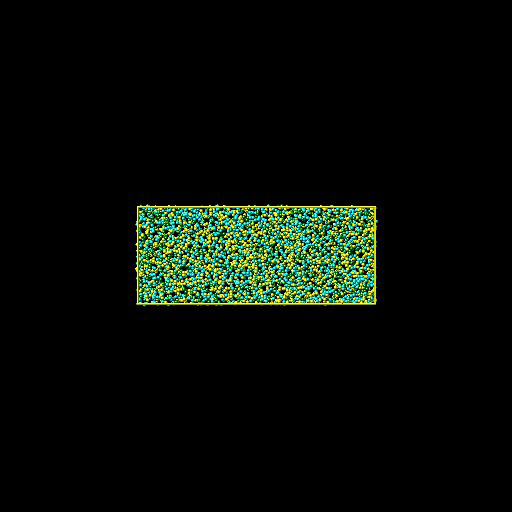

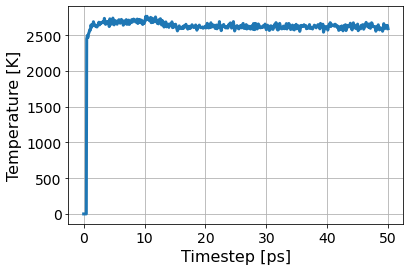

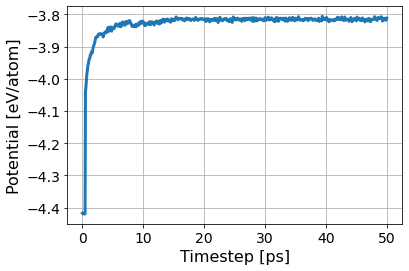

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/1d41085ac4ba4b8995adec4e8241a05e/inputs.yaml
       RUNS/1d41085ac4ba4b8995adec4e8241a05e
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/1d41085ac4ba4b8995adec4e8241a05e/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:49<00:00, 42.76s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/1d41085ac4ba4b8995adec4e8241a05e/inputs.yaml
       RUNS/1d41085ac4ba4b8995adec4e8241a05e
Predicted melting temperature for this potential:  2410.97743681592
95% confidence interval:  2.903109621190663
Fraction of system solid:  0.001736111111111111
Fraction of system liquid:  0.98828125
Simulation Success Flag 0.0
Crystal Structure Info:  [8.000e+00 2.100e+01 3.000e+00 2.000e+01 2.000e+00 4.554e+03 4.608e+03]


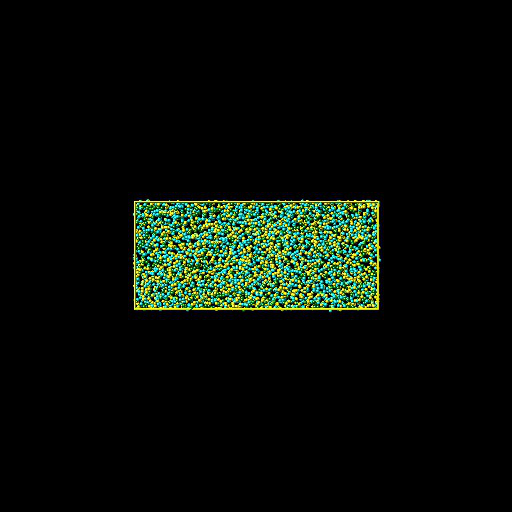

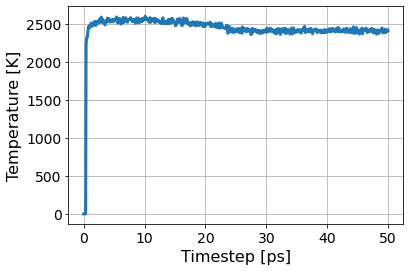

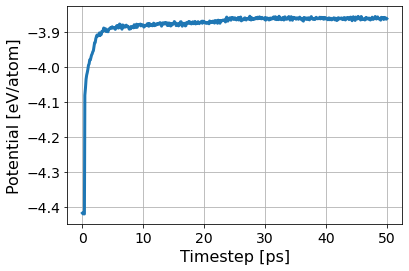

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/5d821505e7084f1990fd3cc4435ccad3/inputs.yaml
       RUNS/5d821505e7084f1990fd3cc4435ccad3
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/5d821505e7084f1990fd3cc4435ccad3/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:54<00:00, 42.96s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/5d821505e7084f1990fd3cc4435ccad3/inputs.yaml
       RUNS/5d821505e7084f1990fd3cc4435ccad3
Predicted melting temperature for this potential:  2414.2157995024872
95% confidence interval:  3.2655411569264334
Fraction of system solid:  0.2554253472222222
Fraction of system liquid:  0.7215711805555556
Simulation Success Flag 0.0
Crystal Structure Info:  [1.177e+03 7.200e+01 2.000e+01 1.200e+01 2.000e+00 3.325e+03 4.608e+03]


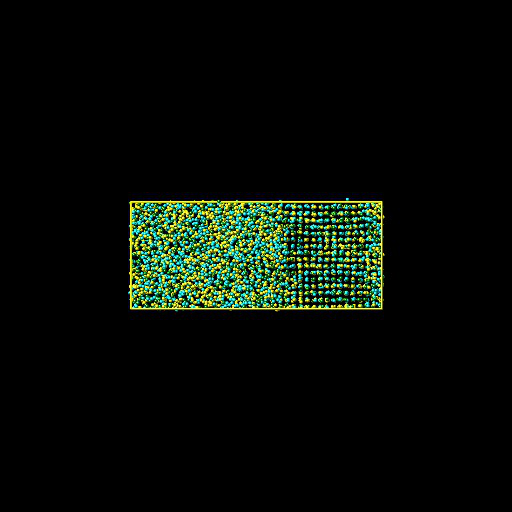

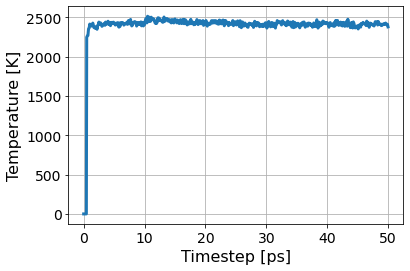

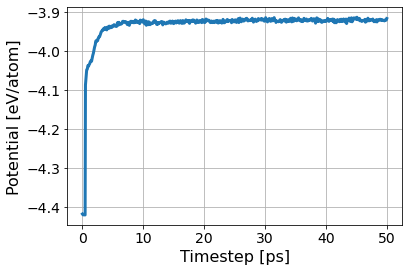

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/65507878c9ae4c549d2d4be30df5d570/inputs.yaml
       RUNS/65507878c9ae4c549d2d4be30df5d570
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/65507878c9ae4c549d2d4be30df5d570/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:02<00:00, 43.32s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/65507878c9ae4c549d2d4be30df5d570/inputs.yaml
       RUNS/65507878c9ae4c549d2d4be30df5d570
Predicted melting temperature for this potential:  2422.417784079602
95% confidence interval:  3.2450079681108477
Fraction of system solid:  0.4485677083333333
Fraction of system liquid:  0.5316840277777778
Simulation Success Flag 1.0
Crystal Structure Info:  [2.067e+03 7.000e+01 1.800e+01 2.000e+00 1.000e+00 2.450e+03 4.608e+03]


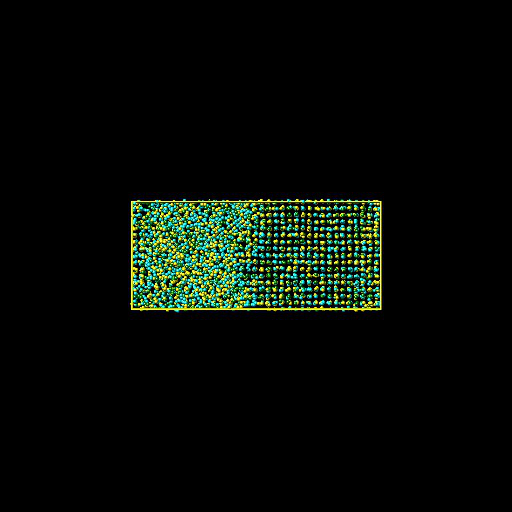

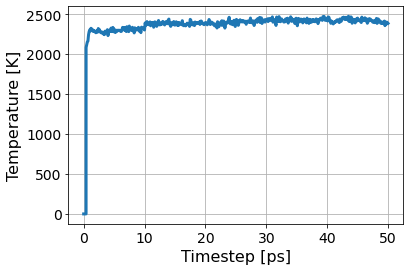

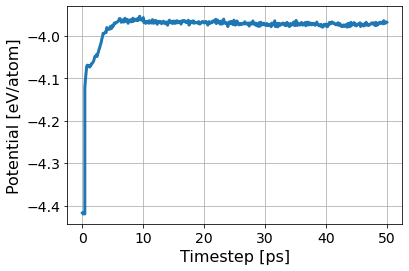

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  1
476
[0.0, 0.4, 0.0, 0.4, 0.2]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/9ecbbc4531364e57b3cf4dd741b558a5/inputs.yaml
       RUNS/9ecbbc4531364e57b3cf4dd741b558a5
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/9ecbbc4531364e57b3cf4dd741b558a5/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:52<00:00, 42.89s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/9ecbbc4531364e57b3cf4dd741b558a5/inputs.yaml
       RUNS/9ecbbc4531364e57b3cf4dd741b558a5
Predicted melting temperature for this potential:  2552.418108955224
95% confidence interval:  3.4803495914088822
Fraction of system solid:  0.002387152777777778
Fraction of system liquid:  0.9861111111111112
Simulation Success Flag 0.0
Crystal Structure Info:  [1.100e+01 2.900e+01 1.000e+00 2.100e+01 2.000e+00 4.544e+03 4.608e+03]


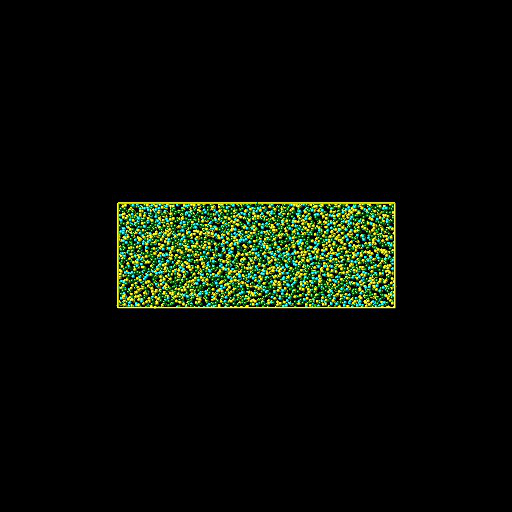

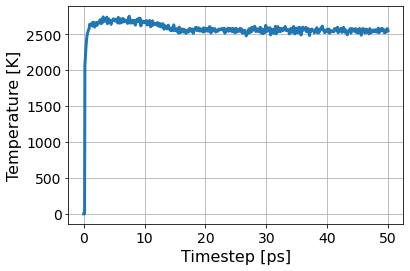

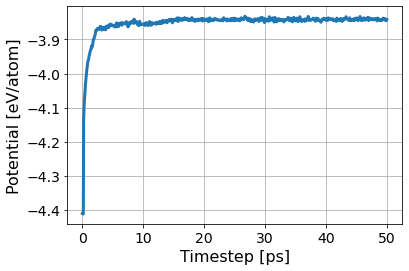

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/75fdd6947d9348a796dd1d08c9a6da17/inputs.yaml
       RUNS/75fdd6947d9348a796dd1d08c9a6da17
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/75fdd6947d9348a796dd1d08c9a6da17/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:37<00:00, 42.28s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/75fdd6947d9348a796dd1d08c9a6da17/inputs.yaml
       RUNS/75fdd6947d9348a796dd1d08c9a6da17
Predicted melting temperature for this potential:  2404.869939800995
95% confidence interval:  2.793524796115382
Fraction of system solid:  0.0015190972222222222
Fraction of system liquid:  0.986328125
Simulation Success Flag 0.0
Crystal Structure Info:  [7.000e+00 3.200e+01 0.000e+00 2.200e+01 2.000e+00 4.545e+03 4.608e+03]


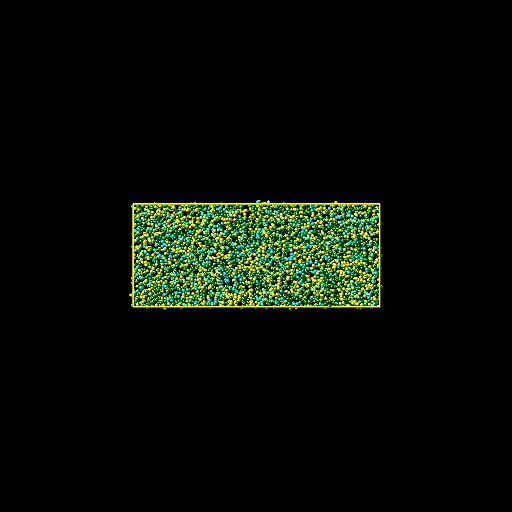

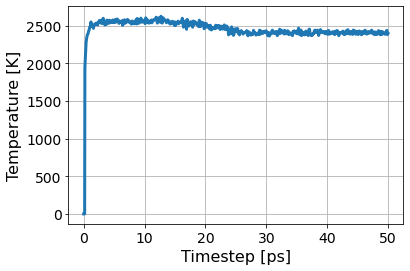

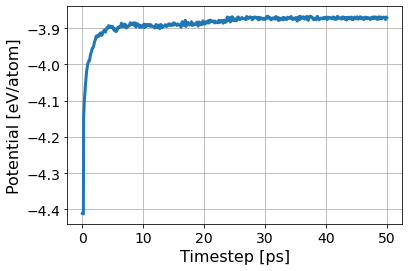

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d9c00717955b4a568464fe23a0f7ccb4/inputs.yaml
       RUNS/d9c00717955b4a568464fe23a0f7ccb4
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/d9c00717955b4a568464fe23a0f7ccb4/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:29<00:00, 42.00s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d9c00717955b4a568464fe23a0f7ccb4/inputs.yaml
       RUNS/d9c00717955b4a568464fe23a0f7ccb4
Predicted melting temperature for this potential:  2403.592627363184
95% confidence interval:  3.287198909112419
Fraction of system solid:  0.2662760416666667
Fraction of system liquid:  0.7157118055555556
Simulation Success Flag 0.0
Crystal Structure Info:  [1.227e+03 5.000e+01 2.200e+01 1.000e+01 1.000e+00 3.298e+03 4.608e+03]


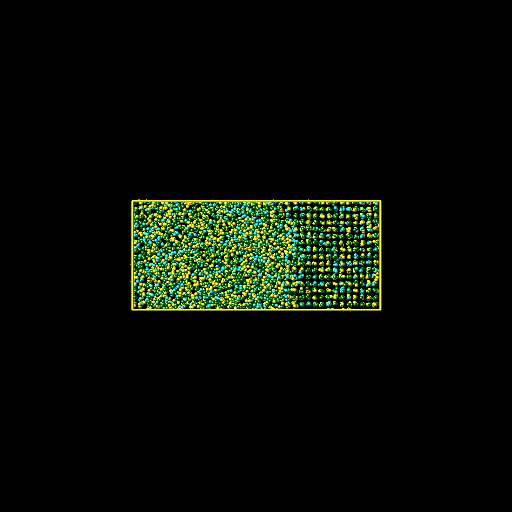

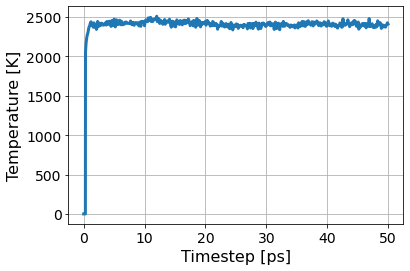

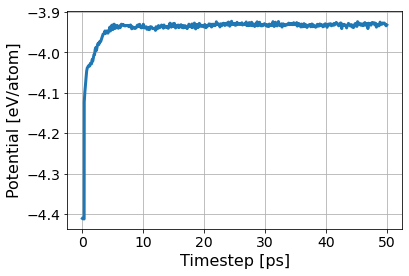

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/312ecf9068564eedb5420c600ed66220/inputs.yaml
       RUNS/312ecf9068564eedb5420c600ed66220
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/312ecf9068564eedb5420c600ed66220/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:34<00:00, 42.20s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/312ecf9068564eedb5420c600ed66220/inputs.yaml
       RUNS/312ecf9068564eedb5420c600ed66220
Predicted melting temperature for this potential:  2395.5503129353233
95% confidence interval:  3.6725443973087684
Fraction of system solid:  0.5629340277777778
Fraction of system liquid:  0.4194878472222222
Simulation Success Flag 1.0
Crystal Structure Info:  [2594.   47.   26.    8.    0. 1933. 4608.]


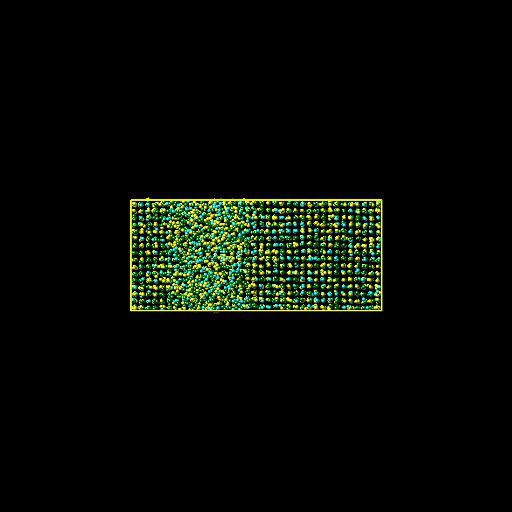

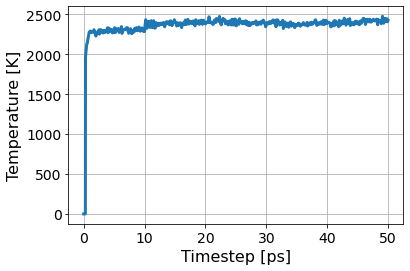

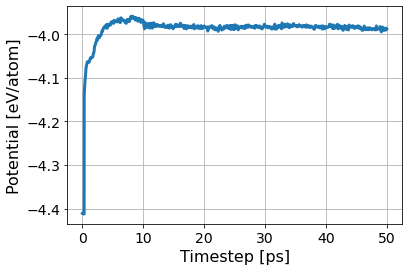

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  2
178
[0.0, 0.1, 0.0, 0.4, 0.5]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d4ccc5ac0b984eea92f8712506fa7346/inputs.yaml
       RUNS/d4ccc5ac0b984eea92f8712506fa7346
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/d4ccc5ac0b984eea92f8712506fa7346/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:12<00:00, 41.32s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/d4ccc5ac0b984eea92f8712506fa7346/inputs.yaml
       RUNS/d4ccc5ac0b984eea92f8712506fa7346
Predicted melting temperature for this potential:  2622.0136348258707
95% confidence interval:  3.923223193281121
Fraction of system solid:  0.0006510416666666666
Fraction of system liquid:  0.9917534722222222
Simulation Success Flag 0.0
Crystal Structure Info:  [3.000e+00 1.500e+01 2.000e+00 1.700e+01 1.000e+00 4.570e+03 4.608e+03]


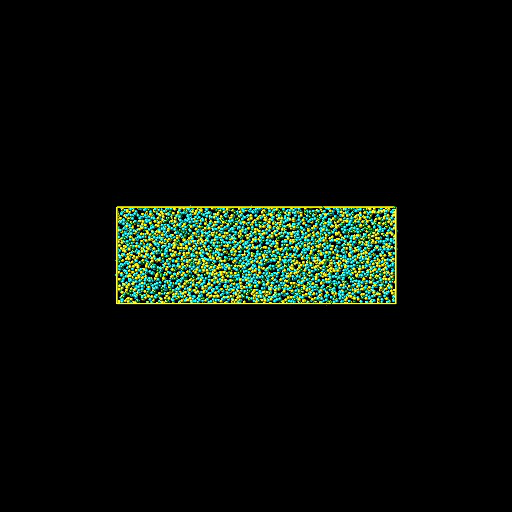

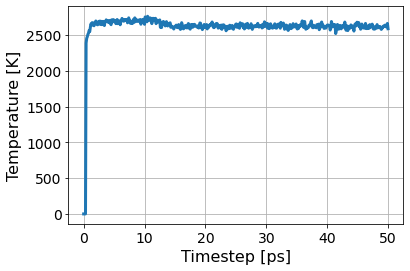

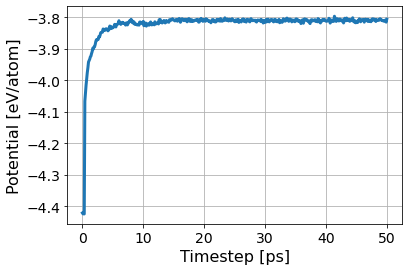

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/592b7e147bff4308a9487d8fe445e923/inputs.yaml
       RUNS/592b7e147bff4308a9487d8fe445e923
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/592b7e147bff4308a9487d8fe445e923/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:31<00:00, 42.04s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/592b7e147bff4308a9487d8fe445e923/inputs.yaml
       RUNS/592b7e147bff4308a9487d8fe445e923
Predicted melting temperature for this potential:  2402.713562686567
95% confidence interval:  3.471744537216975
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9891493055555556
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.800e+01 5.000e+00 2.200e+01 1.000e+00 4.558e+03 4.608e+03]


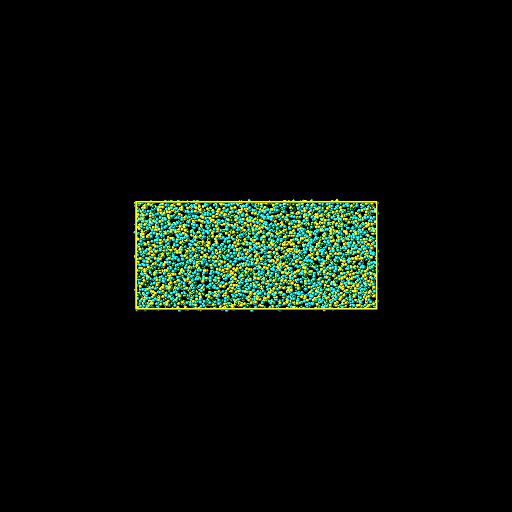

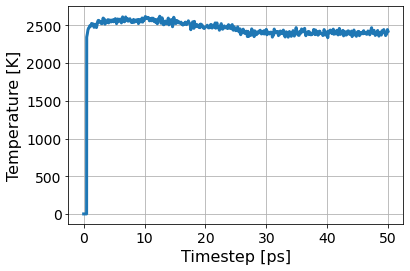

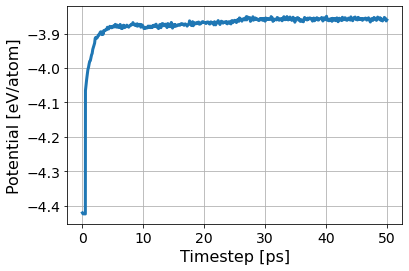

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/58b083df97c743da8c1384f057ffdf40/inputs.yaml
       RUNS/58b083df97c743da8c1384f057ffdf40
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/58b083df97c743da8c1384f057ffdf40/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:29<00:00, 42.00s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/58b083df97c743da8c1384f057ffdf40/inputs.yaml
       RUNS/58b083df97c743da8c1384f057ffdf40
Predicted melting temperature for this potential:  2426.879352736318
95% confidence interval:  3.7764522870239987
Fraction of system solid:  0.2810329861111111
Fraction of system liquid:  0.6987847222222222
Simulation Success Flag 0.0
Crystal Structure Info:  [1295.   51.   31.   11.    0. 3220. 4608.]


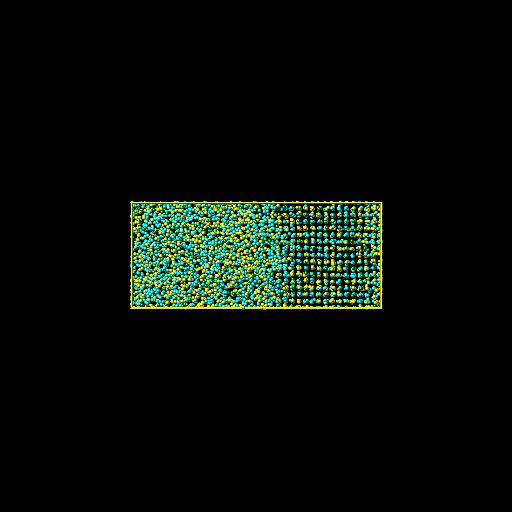

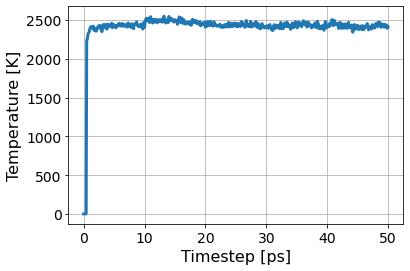

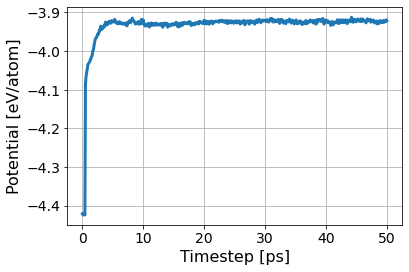

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/8cff312c65404c3cad6004c00425e6d1/inputs.yaml
       RUNS/8cff312c65404c3cad6004c00425e6d1
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/8cff312c65404c3cad6004c00425e6d1/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:40<00:00, 42.44s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/8cff312c65404c3cad6004c00425e6d1/inputs.yaml
       RUNS/8cff312c65404c3cad6004c00425e6d1
Predicted melting temperature for this potential:  2436.2336318407956
95% confidence interval:  3.6990354559372576
Fraction of system solid:  0.4848090277777778
Fraction of system liquid:  0.4943576388888889
Simulation Success Flag 1.0
Crystal Structure Info:  [2.234e+03 6.100e+01 2.600e+01 8.000e+00 1.000e+00 2.278e+03 4.608e+03]


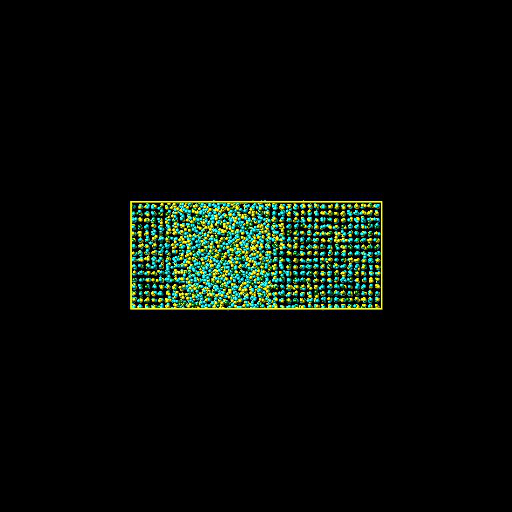

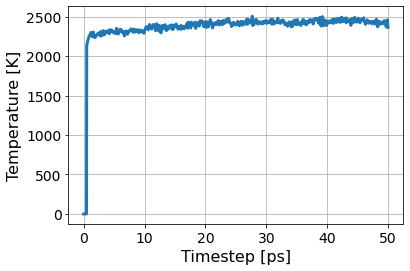

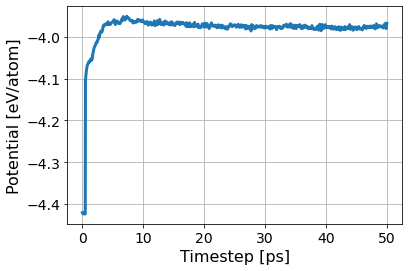

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  3
79
[0.1, 0.0, 0.4, 0.5, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/da0f4b0c5e7849b3b6f7b840789c9119/inputs.yaml
       RUNS/da0f4b0c5e7849b3b6f7b840789c9119
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/da0f4b0c5e7849b3b6f7b840789c9119/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [16:23<00:00, 39.35s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/da0f4b0c5e7849b3b6f7b840789c9119/inputs.yaml
       RUNS/da0f4b0c5e7849b3b6f7b840789c9119
Predicted melting temperature for this potential:  2525.935147761194
95% confidence interval:  3.55618420682576
Fraction of system solid:  0.00021701388888888888
Fraction of system liquid:  0.9943576388888888
Simulation Success Flag 0.0
Crystal Structure Info:  [1.000e+00 1.000e+01 1.000e+00 1.400e+01 0.000e+00 4.582e+03 4.608e+03]


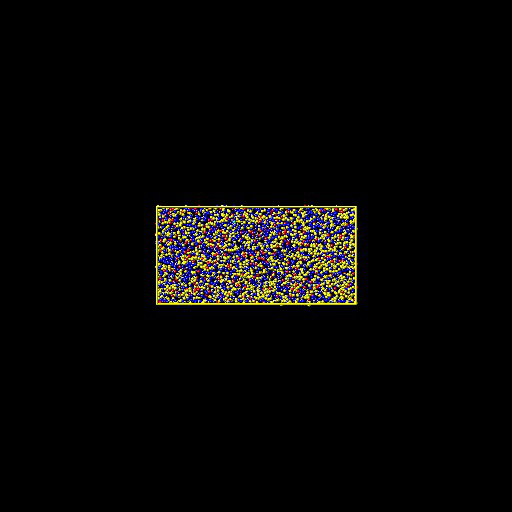

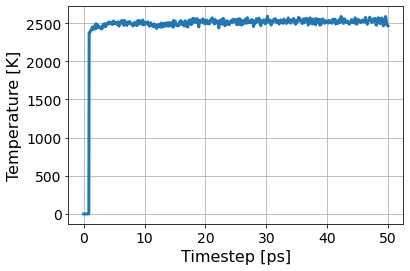

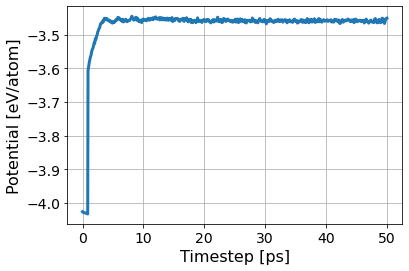

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7f7e5eecdbc2412bbfca446369f1dc0f/inputs.yaml
       RUNS/7f7e5eecdbc2412bbfca446369f1dc0f
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/7f7e5eecdbc2412bbfca446369f1dc0f/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [16:33<00:00, 39.75s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/7f7e5eecdbc2412bbfca446369f1dc0f/inputs.yaml
       RUNS/7f7e5eecdbc2412bbfca446369f1dc0f
Predicted melting temperature for this potential:  2412.2352079601987
95% confidence interval:  3.294129262912321
Fraction of system solid:  0.00021701388888888888
Fraction of system liquid:  0.9934895833333334
Simulation Success Flag 0.0
Crystal Structure Info:  [1.000e+00 1.400e+01 0.000e+00 1.400e+01 1.000e+00 4.578e+03 4.608e+03]


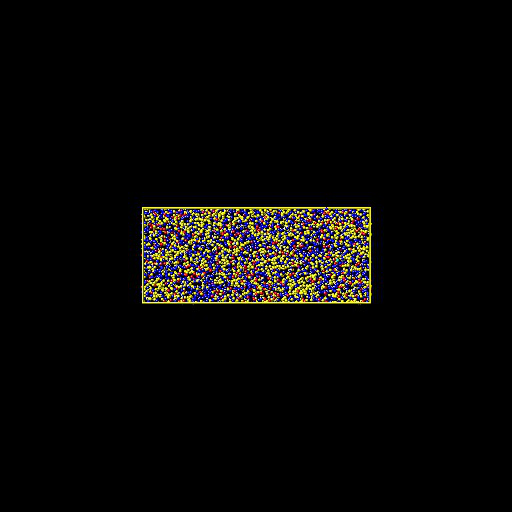

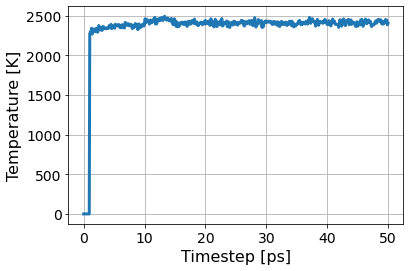

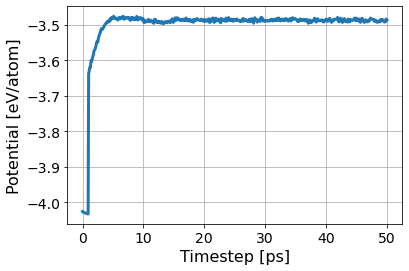

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ada97de302c041f9a03765fb8bd19c99/inputs.yaml
       RUNS/ada97de302c041f9a03765fb8bd19c99
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/ada97de302c041f9a03765fb8bd19c99/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [16:41<00:00, 40.08s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ada97de302c041f9a03765fb8bd19c99/inputs.yaml
       RUNS/ada97de302c041f9a03765fb8bd19c99
Predicted melting temperature for this potential:  2288.010366666667
95% confidence interval:  2.795148120970215
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9913194444444444
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 1.400e+01 0.000e+00 2.000e+01 1.000e+00 4.568e+03 4.608e+03]


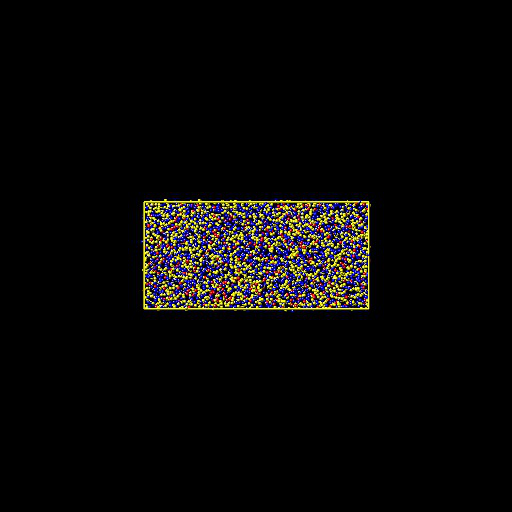

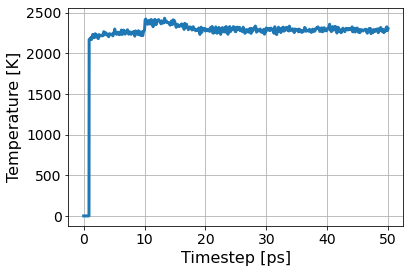

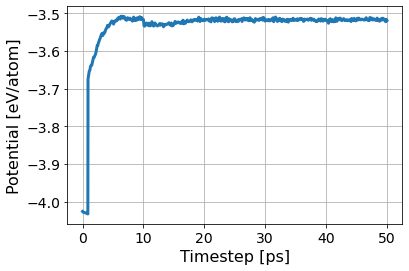

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6b147f04fffd438682febebdd0a0abd1/inputs.yaml
       RUNS/6b147f04fffd438682febebdd0a0abd1
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/6b147f04fffd438682febebdd0a0abd1/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:02<00:00, 40.92s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6b147f04fffd438682febebdd0a0abd1/inputs.yaml
       RUNS/6b147f04fffd438682febebdd0a0abd1
Predicted melting temperature for this potential:  2130.443072636816
95% confidence interval:  2.7882639061447616
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9880642361111112
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 2.500e+01 4.000e+00 1.900e+01 1.000e+00 4.553e+03 4.608e+03]


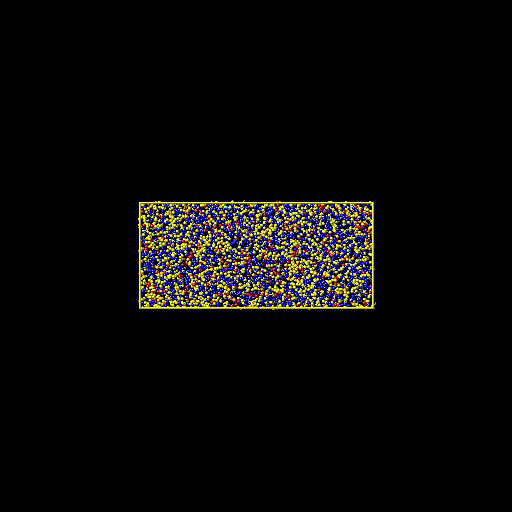

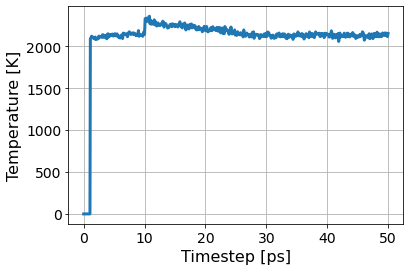

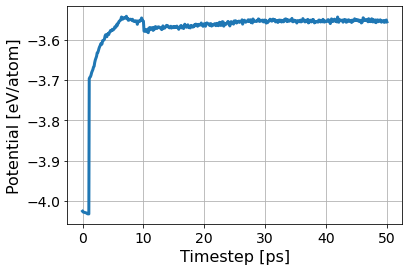

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/1e2e672773c44153be3c8670476f9d5d/inputs.yaml
       RUNS/1e2e672773c44153be3c8670476f9d5d
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/1e2e672773c44153be3c8670476f9d5d/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:05<00:00, 41.04s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/1e2e672773c44153be3c8670476f9d5d/inputs.yaml
       RUNS/1e2e672773c44153be3c8670476f9d5d
Predicted melting temperature for this potential:  2008.5295029850747
95% confidence interval:  4.758886050219625
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9865451388888888
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 3.100e+01 2.000e+00 2.300e+01 1.000e+00 4.546e+03 4.608e+03]


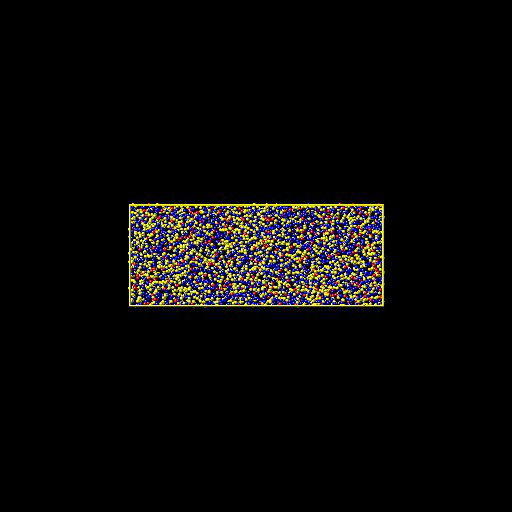

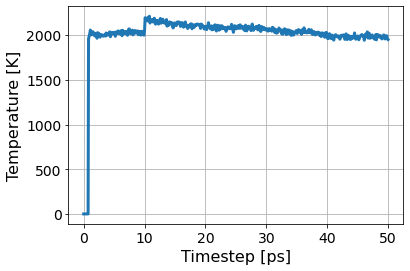

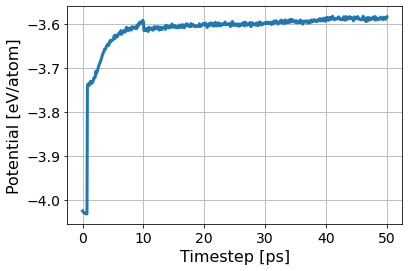

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/8a373647e374416d90e523c4c10ee62a/inputs.yaml
       RUNS/8a373647e374416d90e523c4c10ee62a
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/8a373647e374416d90e523c4c10ee62a/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:20<00:00, 41.60s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/8a373647e374416d90e523c4c10ee62a/inputs.yaml
       RUNS/8a373647e374416d90e523c4c10ee62a
Predicted melting temperature for this potential:  2065.6672537313434
95% confidence interval:  3.367545688018915
Fraction of system solid:  0.5499131944444444
Fraction of system liquid:  0.4348958333333333
Simulation Success Flag 1.0
Crystal Structure Info:  [2.534e+03 5.500e+01 1.400e+01 1.000e+00 0.000e+00 2.004e+03 4.608e+03]


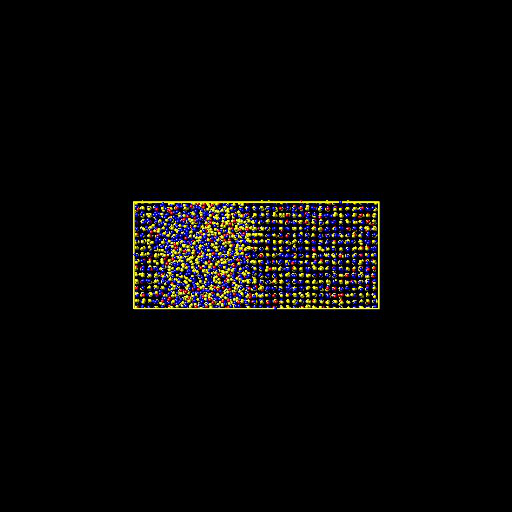

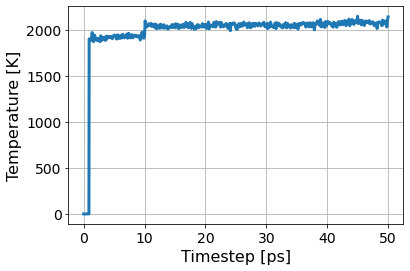

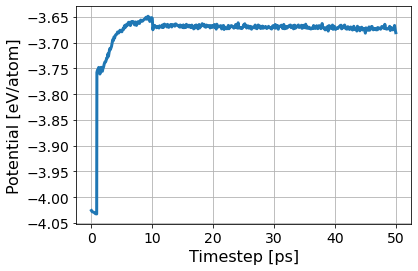

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  4
483
[0.0, 0.4, 0.1, 0.5, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/279687aea54540978c4eeb92904f7bff/inputs.yaml
       RUNS/279687aea54540978c4eeb92904f7bff
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/279687aea54540978c4eeb92904f7bff/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:31<00:00, 42.08s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/279687aea54540978c4eeb92904f7bff/inputs.yaml
       RUNS/279687aea54540978c4eeb92904f7bff
Predicted melting temperature for this potential:  2716.548356716418
95% confidence interval:  3.38436839954722
Fraction of system solid:  0.00043402777777777775
Fraction of system liquid:  0.9954427083333334
Simulation Success Flag 0.0
Crystal Structure Info:  [2.000e+00 1.000e+01 0.000e+00 8.000e+00 1.000e+00 4.587e+03 4.608e+03]


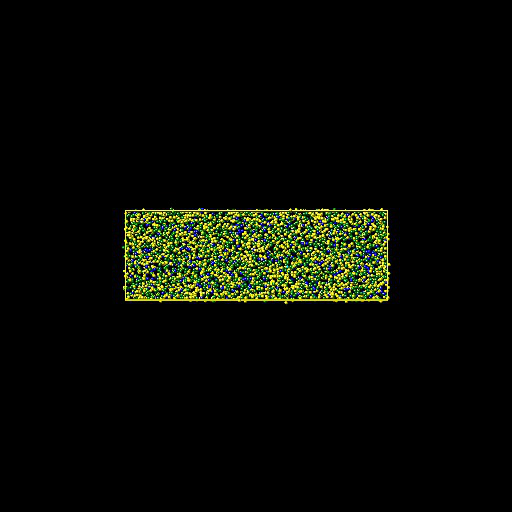

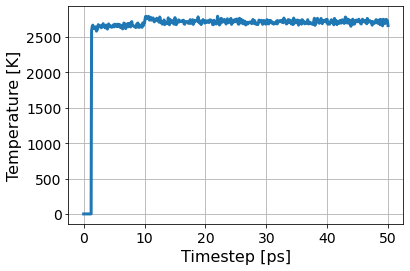

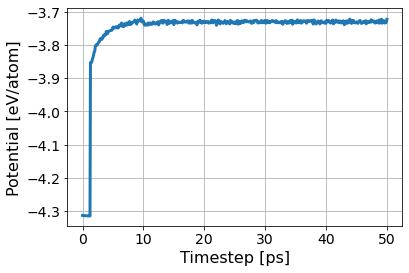

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f7da1d55c04e4ad386a2ca77663006e6/inputs.yaml
       RUNS/f7da1d55c04e4ad386a2ca77663006e6
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/f7da1d55c04e4ad386a2ca77663006e6/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:29<00:00, 42.00s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f7da1d55c04e4ad386a2ca77663006e6/inputs.yaml
       RUNS/f7da1d55c04e4ad386a2ca77663006e6
Predicted melting temperature for this potential:  2434.0962810945275
95% confidence interval:  2.9522480658142376
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9876302083333334
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 2.300e+01 2.000e+00 2.600e+01 0.000e+00 4.551e+03 4.608e+03]


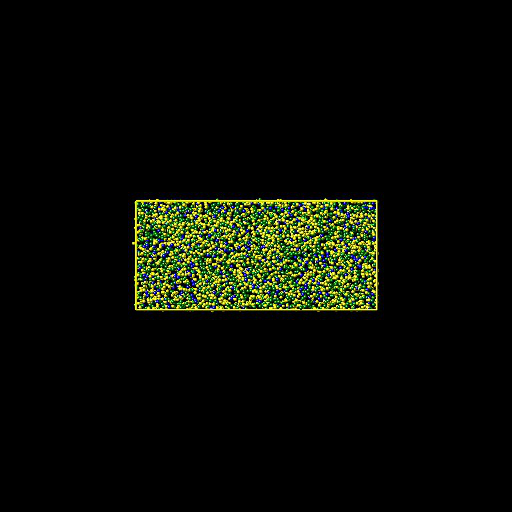

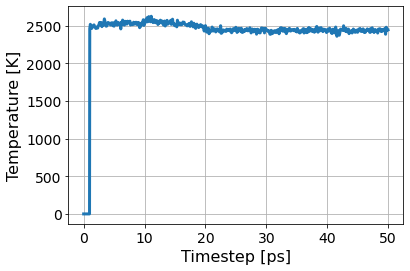

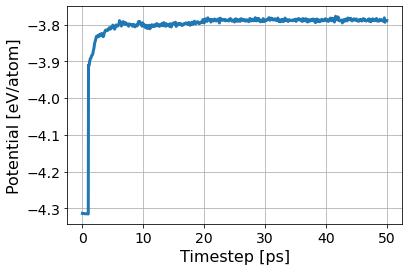

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c354cab44ff445689b3faf99d99785dd/inputs.yaml
       RUNS/c354cab44ff445689b3faf99d99785dd
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/c354cab44ff445689b3faf99d99785dd/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:45<00:00, 42.64s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c354cab44ff445689b3faf99d99785dd/inputs.yaml
       RUNS/c354cab44ff445689b3faf99d99785dd
Predicted melting temperature for this potential:  2320.3795084577114
95% confidence interval:  5.092133066333903
Fraction of system solid:  0.006944444444444444
Fraction of system liquid:  0.9737413194444444
Simulation Success Flag 0.0
Crystal Structure Info:  [  32.   52.   16.   21.    0. 4487. 4608.]


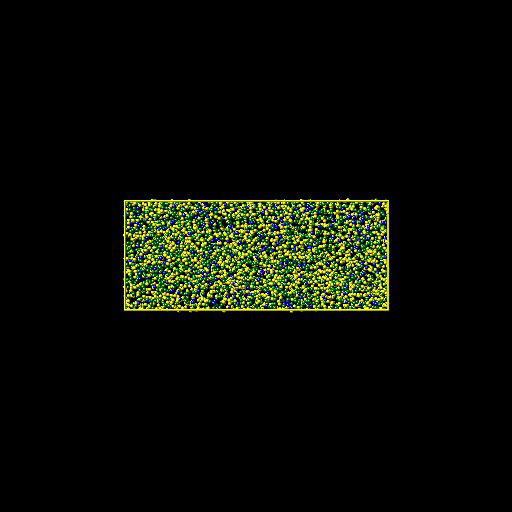

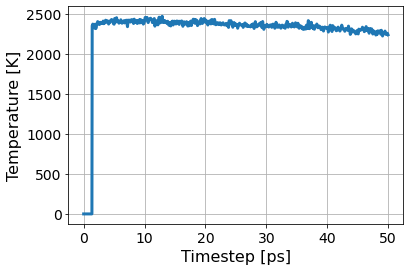

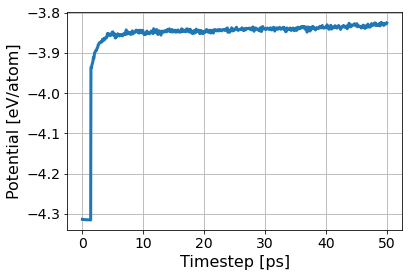

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3f97fd7cf1b94d28bee87fb1008a3f29/inputs.yaml
       RUNS/3f97fd7cf1b94d28bee87fb1008a3f29
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/3f97fd7cf1b94d28bee87fb1008a3f29/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:40<00:00, 42.44s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3f97fd7cf1b94d28bee87fb1008a3f29/inputs.yaml
       RUNS/3f97fd7cf1b94d28bee87fb1008a3f29
Predicted melting temperature for this potential:  2355.698000995025
95% confidence interval:  3.354303659198431
Fraction of system solid:  0.3674045138888889
Fraction of system liquid:  0.6130642361111112
Simulation Success Flag 1.0
Crystal Structure Info:  [1693.   53.   25.   12.    0. 2825. 4608.]


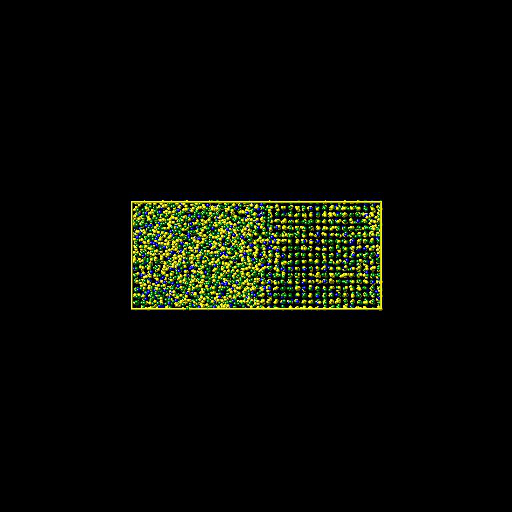

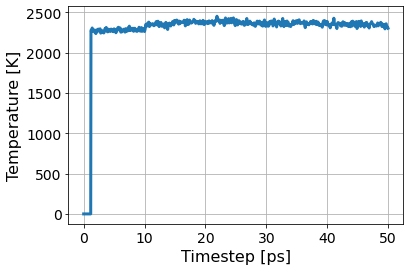

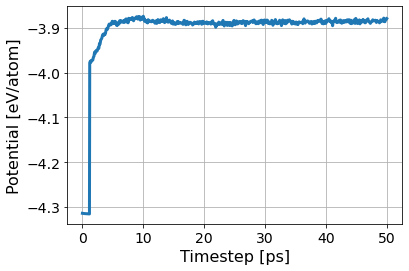

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  5
58
[0.0, 0.0, 0.5, 0.4, 0.1]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/581d48d3222f478ebfd97da7d4c096e1/inputs.yaml
       RUNS/581d48d3222f478ebfd97da7d4c096e1
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/581d48d3222f478ebfd97da7d4c096e1/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [16:19<00:00, 39.20s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/581d48d3222f478ebfd97da7d4c096e1/inputs.yaml
       RUNS/581d48d3222f478ebfd97da7d4c096e1
Predicted melting temperature for this potential:  2422.8092298507463
95% confidence interval:  3.20278763996367
Fraction of system solid:  0.00043402777777777775
Fraction of system liquid:  0.9958767361111112
Simulation Success Flag 0.0
Crystal Structure Info:  [2.000e+00 5.000e+00 0.000e+00 1.000e+01 2.000e+00 4.589e+03 4.608e+03]


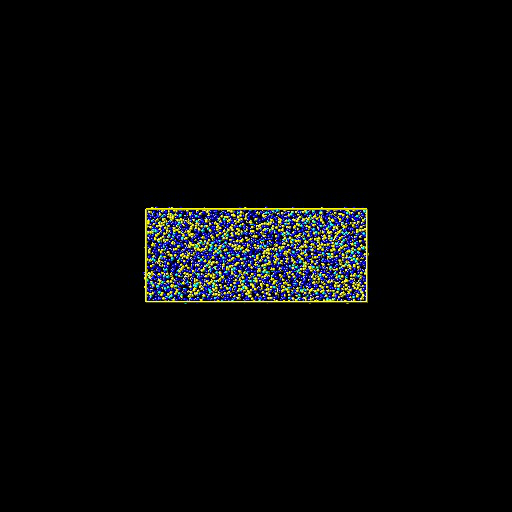

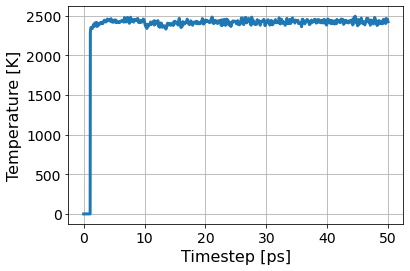

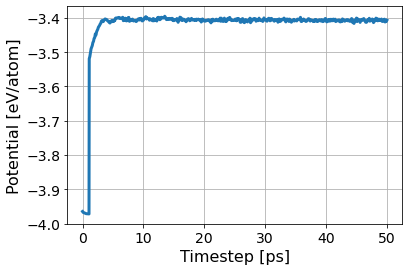

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6cdc5df5d0414152bc172c557260d3b2/inputs.yaml
       RUNS/6cdc5df5d0414152bc172c557260d3b2
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/6cdc5df5d0414152bc172c557260d3b2/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [16:35<00:00, 39.84s/cell]


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6cdc5df5d0414152bc172c557260d3b2/inputs.yaml
       RUNS/6cdc5df5d0414152bc172c557260d3b2
Predicted melting temperature for this potential:  2320.4770313432837
95% confidence interval:  3.177378097494845
Fraction of system solid:  0.00043402777777777775
Fraction of system liquid:  0.9965277777777778
Simulation Success Flag 0.0
Crystal Structure Info:  [2.000e+00 1.000e+01 0.000e+00 3.000e+00 1.000e+00 4.592e+03 4.608e+03]


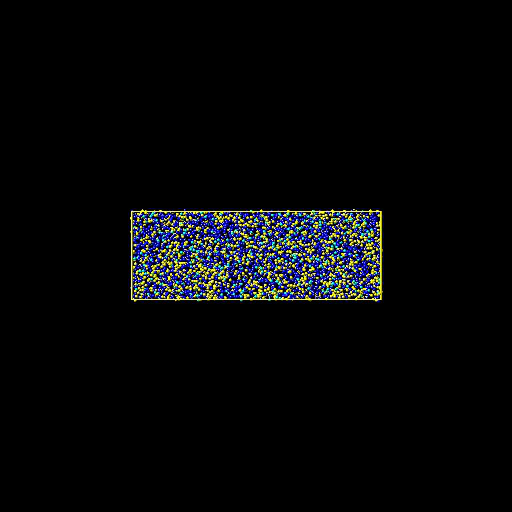

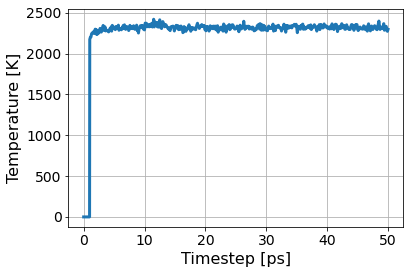

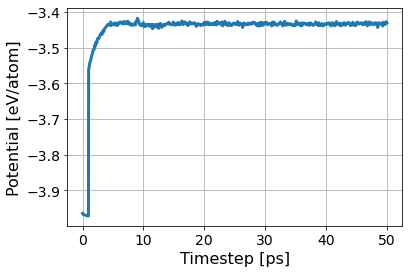

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e0ee909f867d470cadfc58a97e17daeb/inputs.yaml
       RUNS/e0ee909f867d470cadfc58a97e17daeb
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/e0ee909f867d470cadfc58a97e17daeb/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [16:47<00:00, 40.32s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e0ee909f867d470cadfc58a97e17daeb/inputs.yaml
       RUNS/e0ee909f867d470cadfc58a97e17daeb
Predicted melting temperature for this potential:  2181.509213930348
95% confidence interval:  2.8233952838023733
Fraction of system solid:  0.00043402777777777775
Fraction of system liquid:  0.9956597222222222
Simulation Success Flag 0.0
Crystal Structure Info:  [2.000e+00 5.000e+00 0.000e+00 1.200e+01 1.000e+00 4.588e+03 4.608e+03]


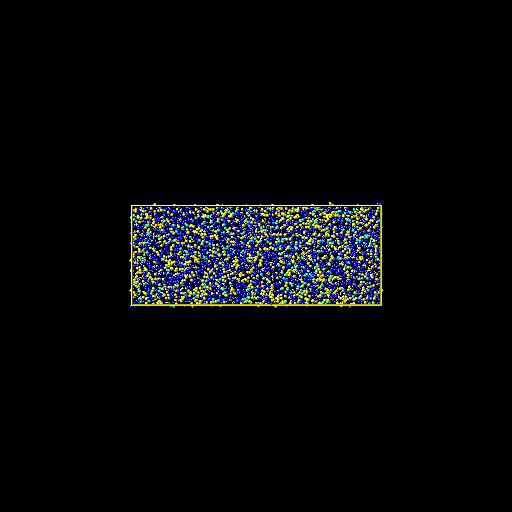

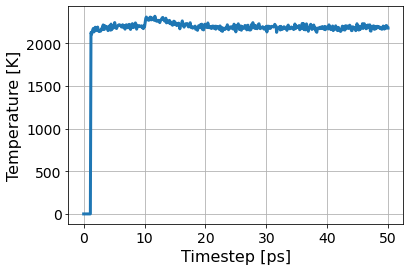

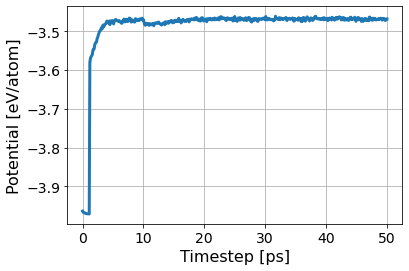

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/63405e676b524bdd93901a71fd300b6e/inputs.yaml
       RUNS/63405e676b524bdd93901a71fd300b6e
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/63405e676b524bdd93901a71fd300b6e/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [16:54<00:00, 40.60s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/63405e676b524bdd93901a71fd300b6e/inputs.yaml
       RUNS/63405e676b524bdd93901a71fd300b6e
Predicted melting temperature for this potential:  2033.951056716418
95% confidence interval:  2.564450335103025
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9889322916666666
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 2.100e+01 2.000e+00 2.100e+01 1.000e+00 4.557e+03 4.608e+03]


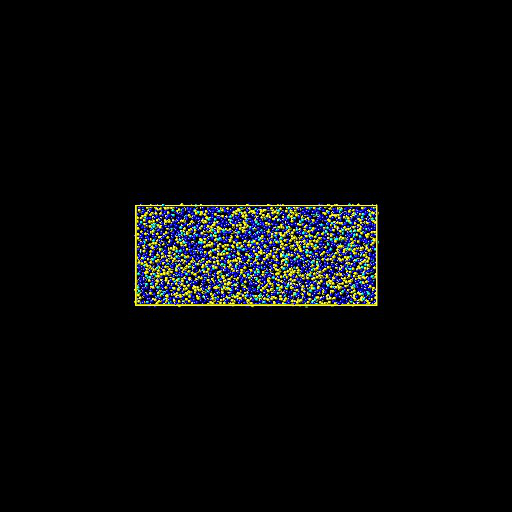

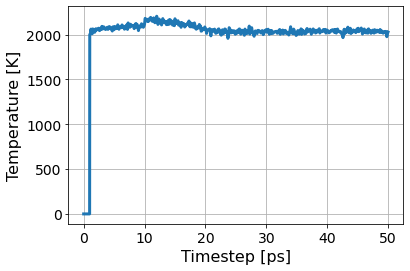

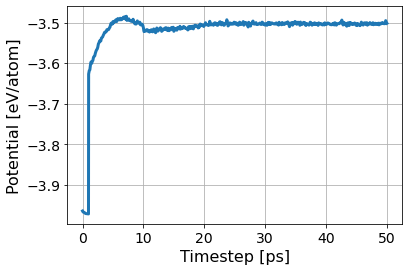

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b28cc98b57264cd1a6248f0cdb0421a3/inputs.yaml
       RUNS/b28cc98b57264cd1a6248f0cdb0421a3
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/b28cc98b57264cd1a6248f0cdb0421a3/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:10<00:00, 41.20s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b28cc98b57264cd1a6248f0cdb0421a3/inputs.yaml
       RUNS/b28cc98b57264cd1a6248f0cdb0421a3
Predicted melting temperature for this potential:  1936.3494084577114
95% confidence interval:  2.6029432202117295
Fraction of system solid:  0.001736111111111111
Fraction of system liquid:  0.9876302083333334
Simulation Success Flag 0.0
Crystal Structure Info:  [8.000e+00 1.700e+01 1.000e+00 2.900e+01 2.000e+00 4.551e+03 4.608e+03]


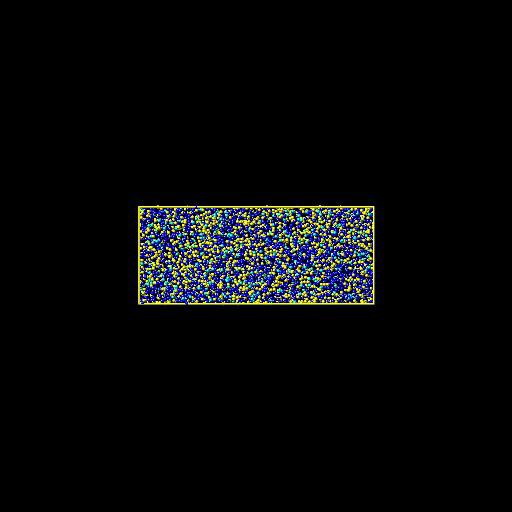

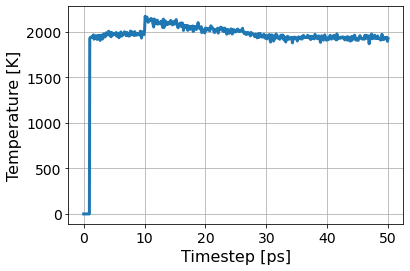

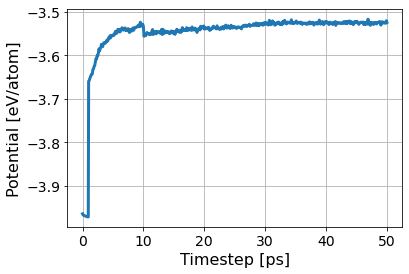

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e45a6048dda24753a358c68b9973d84e/inputs.yaml
       RUNS/e45a6048dda24753a358c68b9973d84e
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/e45a6048dda24753a358c68b9973d84e/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:26<00:00, 41.84s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e45a6048dda24753a358c68b9973d84e/inputs.yaml
       RUNS/e45a6048dda24753a358c68b9973d84e
Predicted melting temperature for this potential:  1959.2874985074627
95% confidence interval:  2.6299734297853314
Fraction of system solid:  0.4214409722222222
Fraction of system liquid:  0.5674913194444444
Simulation Success Flag 1.0
Crystal Structure Info:  [1942.   33.   13.    5.    0. 2615. 4608.]


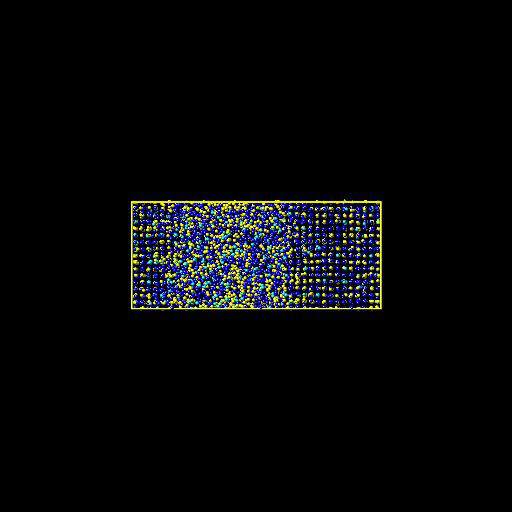

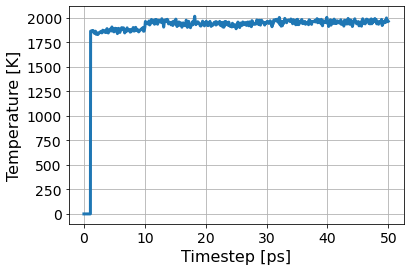

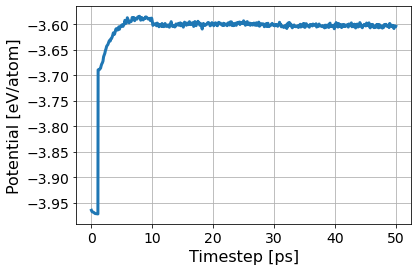

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  6
86
[0.2, 0.0, 0.0, 0.4, 0.4]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e35121fbf3d742cab140992762ef4a89/inputs.yaml
       RUNS/e35121fbf3d742cab140992762ef4a89
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/e35121fbf3d742cab140992762ef4a89/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:48<00:00, 42.72s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e35121fbf3d742cab140992762ef4a89/inputs.yaml
       RUNS/e35121fbf3d742cab140992762ef4a89
Predicted melting temperature for this potential:  2514.082130845771
95% confidence interval:  3.3124300138655403
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9878472222222222
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 2.200e+01 0.000e+00 2.700e+01 2.000e+00 4.552e+03 4.608e+03]


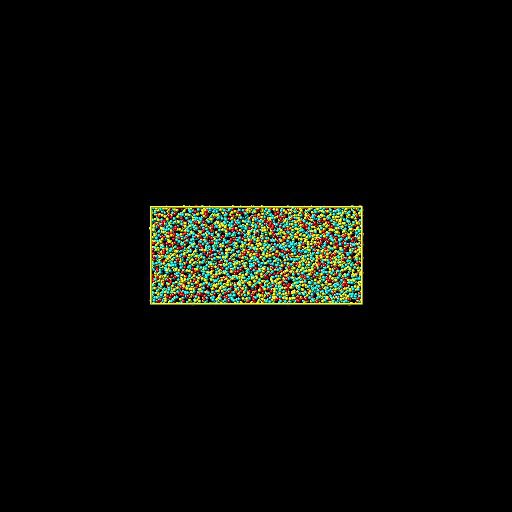

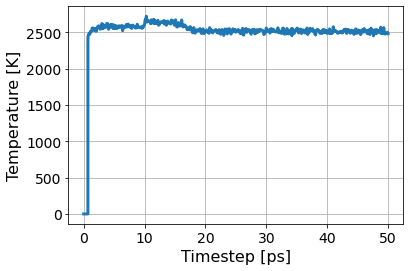

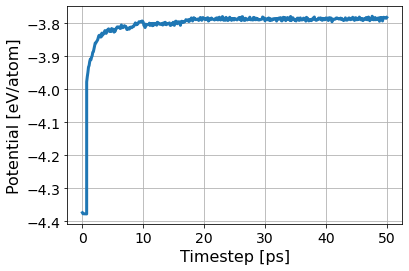

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c927c48f16f44dc3b3d7ee39b77128d8/inputs.yaml
       RUNS/c927c48f16f44dc3b3d7ee39b77128d8
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/c927c48f16f44dc3b3d7ee39b77128d8/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:02<00:00, 43.32s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c927c48f16f44dc3b3d7ee39b77128d8/inputs.yaml
       RUNS/c927c48f16f44dc3b3d7ee39b77128d8
Predicted melting temperature for this potential:  2318.238557711443
95% confidence interval:  4.609347782919139
Fraction of system solid:  0.0015190972222222222
Fraction of system liquid:  0.9869791666666666
Simulation Success Flag 0.0
Crystal Structure Info:  [7.000e+00 2.500e+01 3.000e+00 2.500e+01 0.000e+00 4.548e+03 4.608e+03]


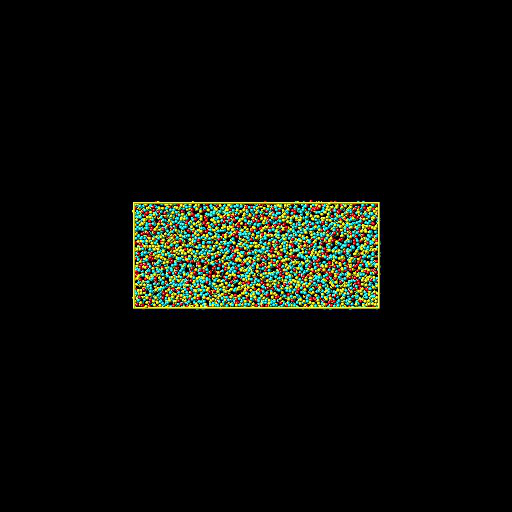

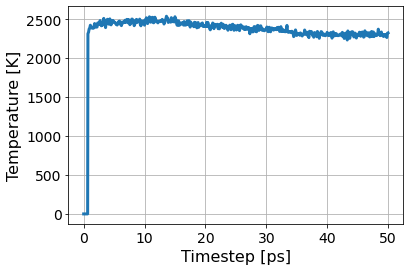

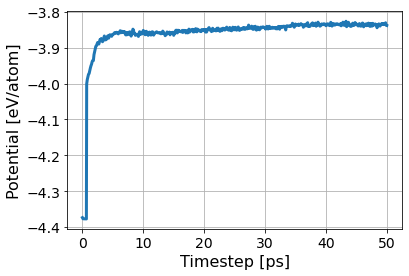

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/cc671bb89782488783331750a637c42c/inputs.yaml
       RUNS/cc671bb89782488783331750a637c42c
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/cc671bb89782488783331750a637c42c/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:51<00:00, 42.88s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/cc671bb89782488783331750a637c42c/inputs.yaml
       RUNS/cc671bb89782488783331750a637c42c
Predicted melting temperature for this potential:  2344.633132835821
95% confidence interval:  3.220096182624173
Fraction of system solid:  0.3068576388888889
Fraction of system liquid:  0.6770833333333334
Simulation Success Flag 0.0
Crystal Structure Info:  [1.414e+03 4.700e+01 9.000e+00 1.700e+01 1.000e+00 3.120e+03 4.608e+03]


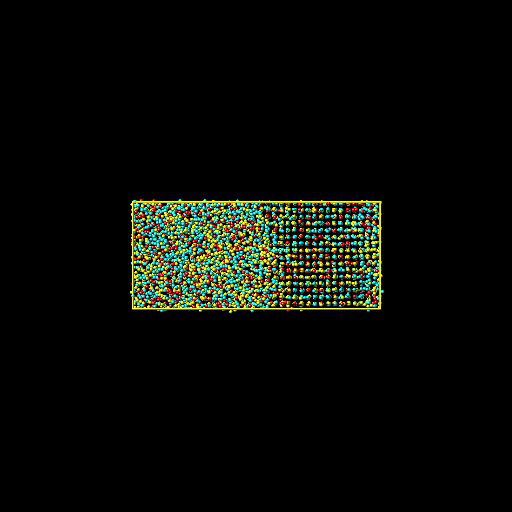

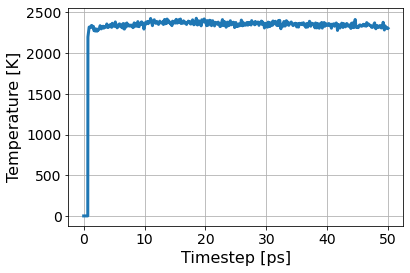

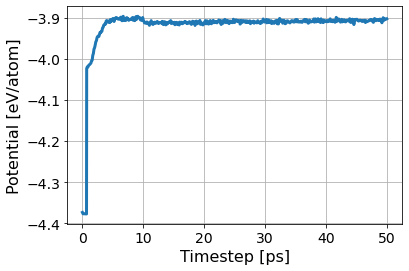

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/00c454f0a8904e50a6ede9238bb6a0f2/inputs.yaml
       RUNS/00c454f0a8904e50a6ede9238bb6a0f2
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/00c454f0a8904e50a6ede9238bb6a0f2/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:09<00:00, 43.56s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/00c454f0a8904e50a6ede9238bb6a0f2/inputs.yaml
       RUNS/00c454f0a8904e50a6ede9238bb6a0f2
Predicted melting temperature for this potential:  2347.349593034826
95% confidence interval:  3.5236494099853632
Fraction of system solid:  0.5718315972222222
Fraction of system liquid:  0.4157986111111111
Simulation Success Flag 1.0
Crystal Structure Info:  [2635.   36.   16.    5.    0. 1916. 4608.]


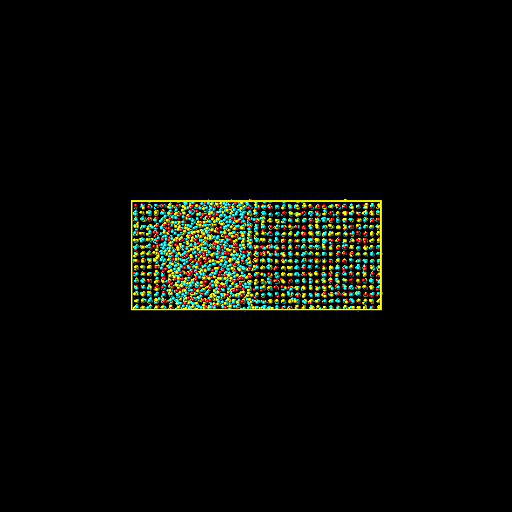

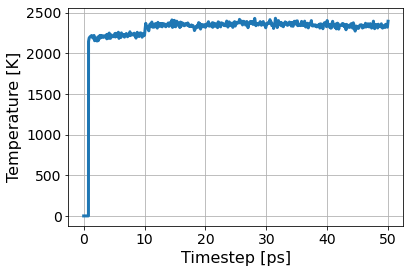

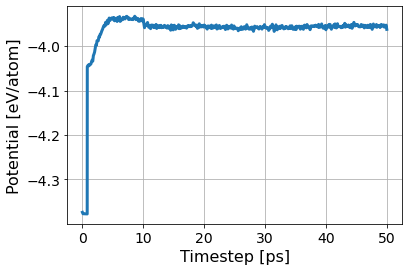

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  7
519
[0.2, 0.4, 0.0, 0.4, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6319ad26f8304dc49d59a5aba02a1c57/inputs.yaml
       RUNS/6319ad26f8304dc49d59a5aba02a1c57
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/6319ad26f8304dc49d59a5aba02a1c57/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:47<00:00, 42.72s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6319ad26f8304dc49d59a5aba02a1c57/inputs.yaml
       RUNS/6319ad26f8304dc49d59a5aba02a1c57
Predicted melting temperature for this potential:  2501.032389552239
95% confidence interval:  3.1536763268327044
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9900173611111112
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 1.700e+01 3.000e+00 1.900e+01 1.000e+00 4.562e+03 4.608e+03]


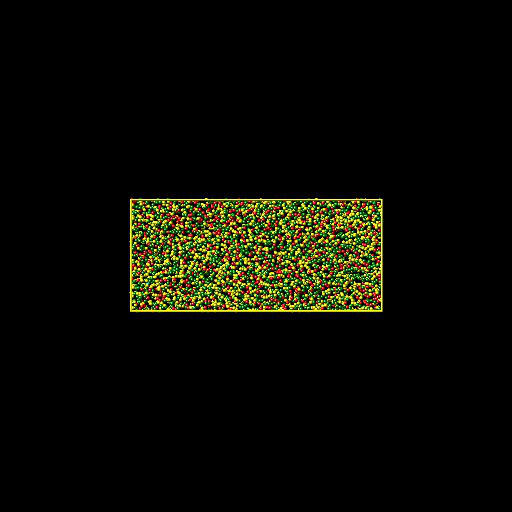

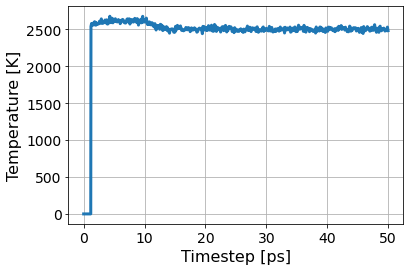

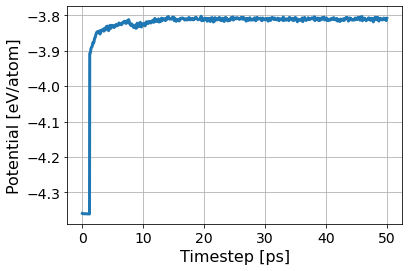

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f8ad2bc384f34ad88beb8194f9536a14/inputs.yaml
       RUNS/f8ad2bc384f34ad88beb8194f9536a14
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/f8ad2bc384f34ad88beb8194f9536a14/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:38<00:00, 42.36s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f8ad2bc384f34ad88beb8194f9536a14/inputs.yaml
       RUNS/f8ad2bc384f34ad88beb8194f9536a14
Predicted melting temperature for this potential:  2307.949251243781
95% confidence interval:  2.9679499184322005
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9884982638888888
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 2.700e+01 3.000e+00 1.700e+01 0.000e+00 4.555e+03 4.608e+03]


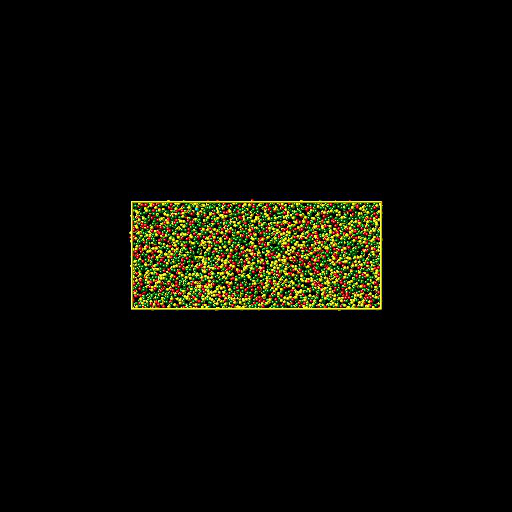

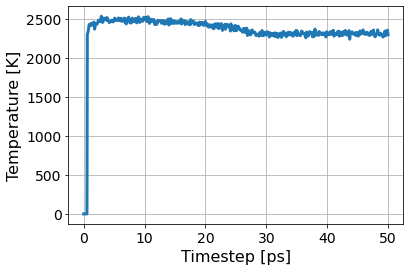

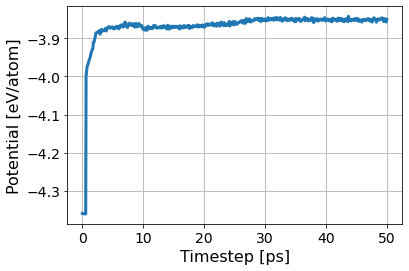

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3c4b659b6ecb4ff3b3f6043d96ac0e4d/inputs.yaml
       RUNS/3c4b659b6ecb4ff3b3f6043d96ac0e4d
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/3c4b659b6ecb4ff3b3f6043d96ac0e4d/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:46<00:00, 42.68s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/3c4b659b6ecb4ff3b3f6043d96ac0e4d/inputs.yaml
       RUNS/3c4b659b6ecb4ff3b3f6043d96ac0e4d
Predicted melting temperature for this potential:  2357.4149144278604
95% confidence interval:  3.2111090627313117
Fraction of system solid:  0.2673611111111111
Fraction of system liquid:  0.7111545138888888
Simulation Success Flag 0.0
Crystal Structure Info:  [1232.   52.   38.    9.    0. 3277. 4608.]


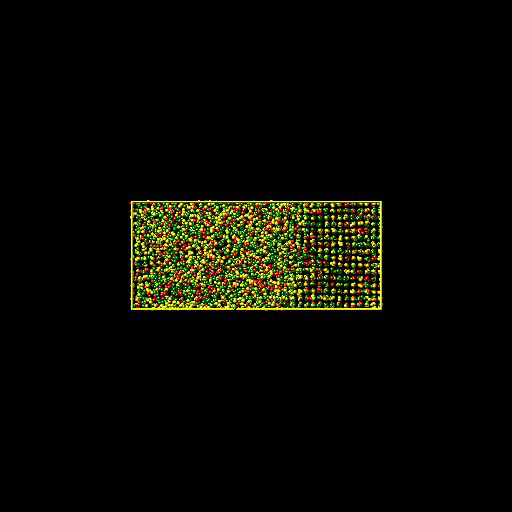

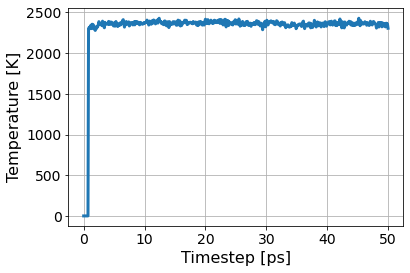

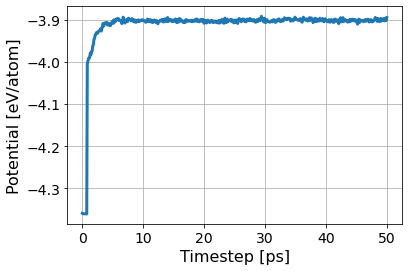

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c6d91b923736465b9455d022886576c1/inputs.yaml
       RUNS/c6d91b923736465b9455d022886576c1
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/c6d91b923736465b9455d022886576c1/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:54<00:00, 43.00s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c6d91b923736465b9455d022886576c1/inputs.yaml
       RUNS/c6d91b923736465b9455d022886576c1
Predicted melting temperature for this potential:  2365.9529990049755
95% confidence interval:  3.1963272783214
Fraction of system solid:  0.4973958333333333
Fraction of system liquid:  0.4763454861111111
Simulation Success Flag 1.0
Crystal Structure Info:  [2.292e+03 6.600e+01 5.000e+01 4.000e+00 1.000e+00 2.195e+03 4.608e+03]


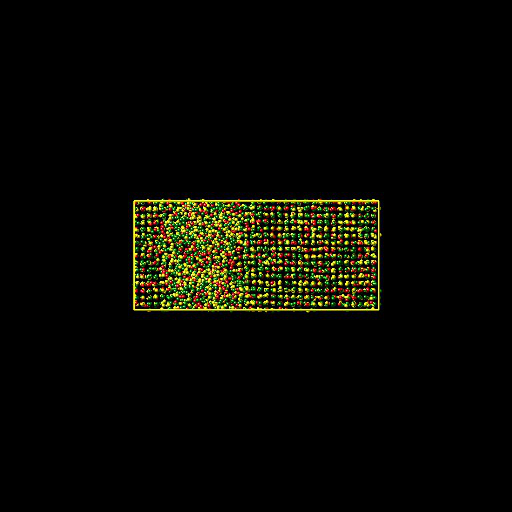

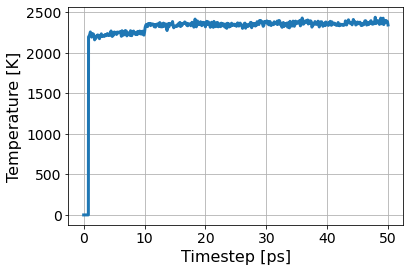

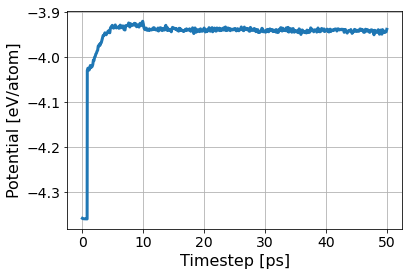

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  8
547
[0.0, 0.5, 0.0, 0.4, 0.1]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/53c15bfd4057496aba9ae86d82095001/inputs.yaml
       RUNS/53c15bfd4057496aba9ae86d82095001
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/53c15bfd4057496aba9ae86d82095001/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:07<00:00, 41.12s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/53c15bfd4057496aba9ae86d82095001/inputs.yaml
       RUNS/53c15bfd4057496aba9ae86d82095001
Predicted melting temperature for this potential:  2554.7240348258706
95% confidence interval:  3.261405841969857
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9876302083333334
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 2.900e+01 3.000e+00 1.800e+01 2.000e+00 4.551e+03 4.608e+03]


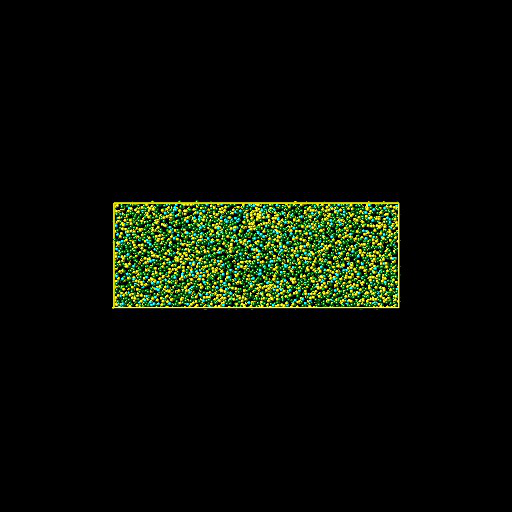

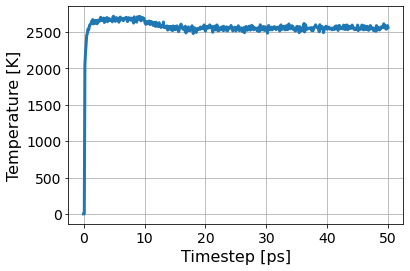

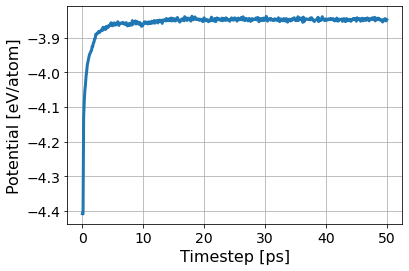

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/792bbe1b075f4c66be15913fadd3474f/inputs.yaml
       RUNS/792bbe1b075f4c66be15913fadd3474f
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/792bbe1b075f4c66be15913fadd3474f/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:05<00:00, 41.04s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/792bbe1b075f4c66be15913fadd3474f/inputs.yaml
       RUNS/792bbe1b075f4c66be15913fadd3474f
Predicted melting temperature for this potential:  2405.2897870646766
95% confidence interval:  3.0269770033885193
Fraction of system solid:  0.001736111111111111
Fraction of system liquid:  0.9852430555555556
Simulation Success Flag 0.0
Crystal Structure Info:  [   8.   26.    5.   29.    0. 4540. 4608.]


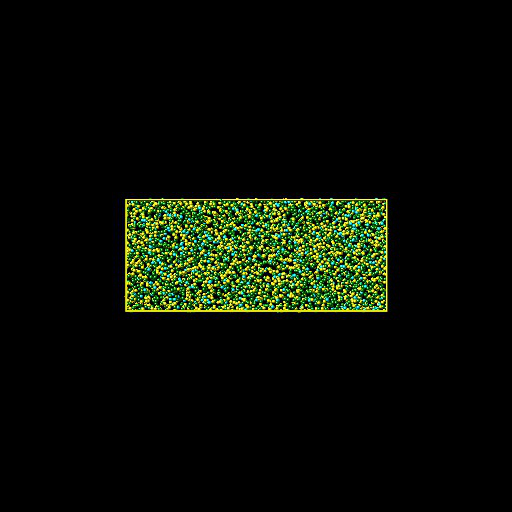

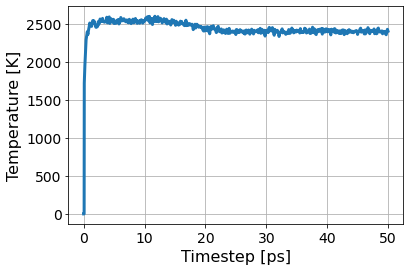

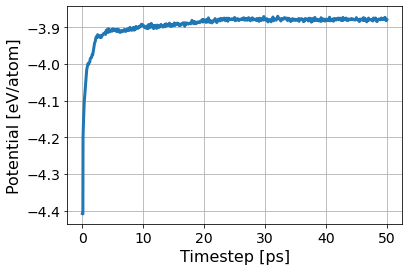

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/1bf121cd9f324d51aefb56b18e030b5e/inputs.yaml
       RUNS/1bf121cd9f324d51aefb56b18e030b5e
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/1bf121cd9f324d51aefb56b18e030b5e/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:12<00:00, 41.32s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/1bf121cd9f324d51aefb56b18e030b5e/inputs.yaml
       RUNS/1bf121cd9f324d51aefb56b18e030b5e
Predicted melting temperature for this potential:  2431.133693034826
95% confidence interval:  3.4043898922595086
Fraction of system solid:  0.3129340277777778
Fraction of system liquid:  0.6588541666666666
Simulation Success Flag 0.0
Crystal Structure Info:  [1442.   81.   29.   20.    0. 3036. 4608.]


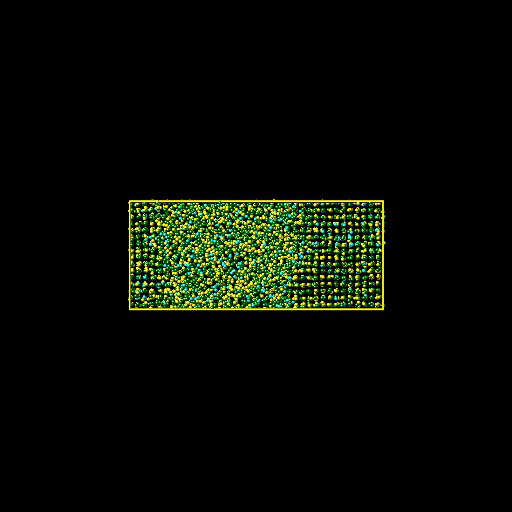

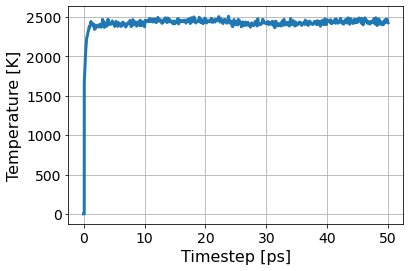

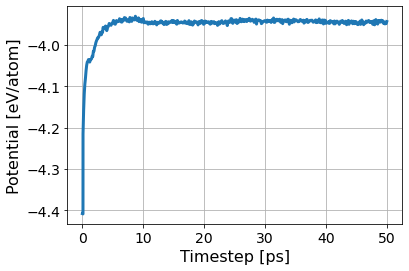

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2c1a247c9e394e98afc684e9b89c77a3/inputs.yaml
       RUNS/2c1a247c9e394e98afc684e9b89c77a3
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/2c1a247c9e394e98afc684e9b89c77a3/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:22<00:00, 41.72s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/2c1a247c9e394e98afc684e9b89c77a3/inputs.yaml
       RUNS/2c1a247c9e394e98afc684e9b89c77a3
Predicted melting temperature for this potential:  2420.31227960199
95% confidence interval:  3.390044277276558
Fraction of system solid:  0.5075954861111112
Fraction of system liquid:  0.4626736111111111
Simulation Success Flag 1.0
Crystal Structure Info:  [2339.   72.   59.    6.    0. 2132. 4608.]


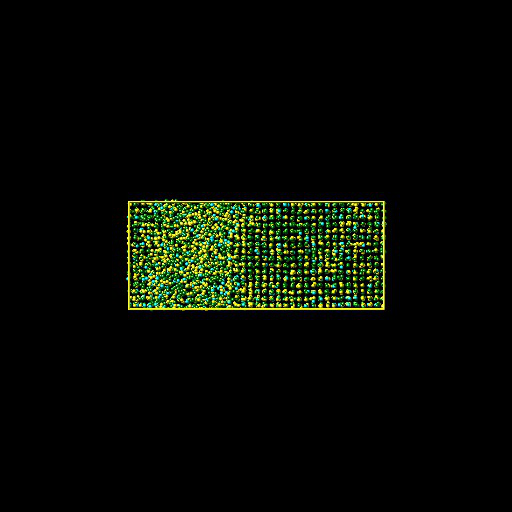

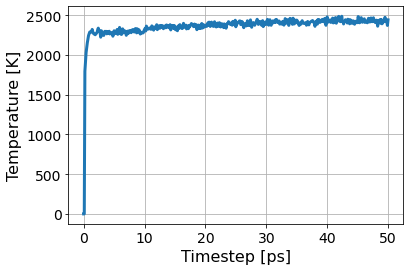

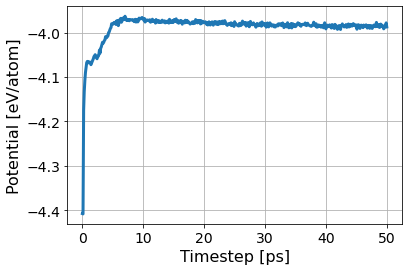

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  9
202
[0.0, 0.1, 0.5, 0.4, 0.0]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/26caaa366fce42b287f2fdd443010792/inputs.yaml
       RUNS/26caaa366fce42b287f2fdd443010792
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/26caaa366fce42b287f2fdd443010792/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [16:34<00:00, 39.80s/cell]


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/26caaa366fce42b287f2fdd443010792/inputs.yaml
       RUNS/26caaa366fce42b287f2fdd443010792
Predicted melting temperature for this potential:  2334.6219079601988
95% confidence interval:  3.0838145173762315
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9954427083333334
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 4.000e+00 1.000e+00 1.100e+01 1.000e+00 4.587e+03 4.608e+03]


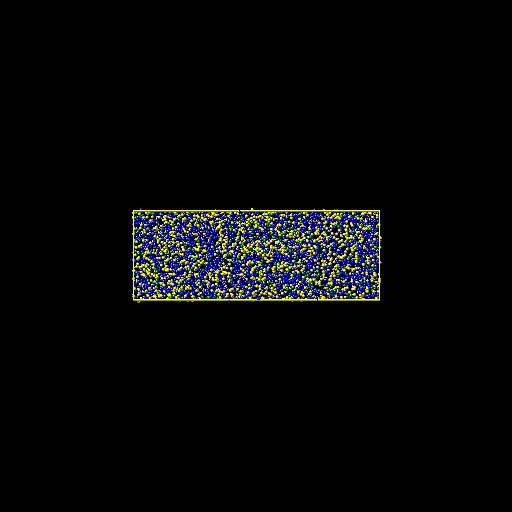

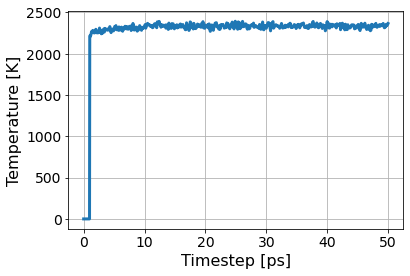

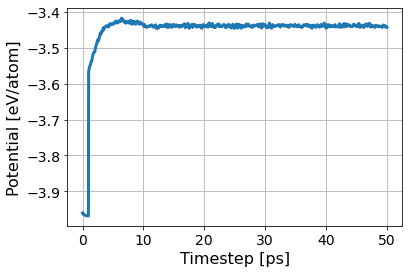

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/8b7e34c5c4b24ab28db28c4d90ff1c89/inputs.yaml
       RUNS/8b7e34c5c4b24ab28db28c4d90ff1c89
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/8b7e34c5c4b24ab28db28c4d90ff1c89/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [16:37<00:00, 39.92s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/8b7e34c5c4b24ab28db28c4d90ff1c89/inputs.yaml
       RUNS/8b7e34c5c4b24ab28db28c4d90ff1c89
Predicted melting temperature for this potential:  2189.200499004975
95% confidence interval:  2.5855123714302954
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9921875
Simulation Success Flag 0.0
Crystal Structure Info:  [   5.   17.    0.   14.    0. 4572. 4608.]


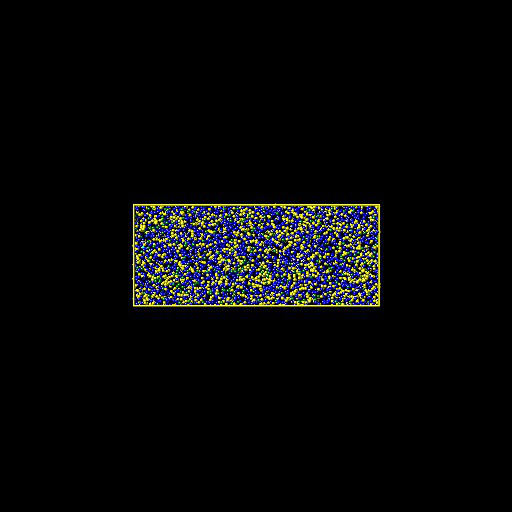

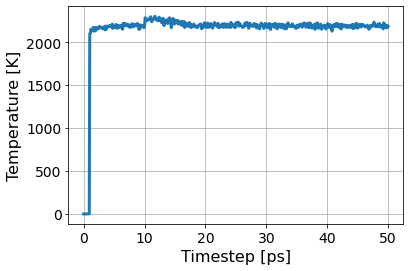

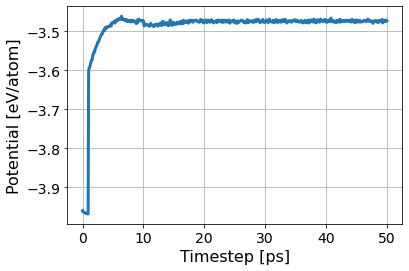

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4e94cc6c3da94bafbd8226e906e08bf3/inputs.yaml
       RUNS/4e94cc6c3da94bafbd8226e906e08bf3
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/4e94cc6c3da94bafbd8226e906e08bf3/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [16:51<00:00, 40.48s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4e94cc6c3da94bafbd8226e906e08bf3/inputs.yaml
       RUNS/4e94cc6c3da94bafbd8226e906e08bf3
Predicted melting temperature for this potential:  2079.740860199005
95% confidence interval:  2.6167172564348053
Fraction of system solid:  0.0
Fraction of system liquid:  0.9919704861111112
Simulation Success Flag 0.0
Crystal Structure Info:  [0.000e+00 1.400e+01 4.000e+00 1.700e+01 2.000e+00 4.571e+03 4.608e+03]


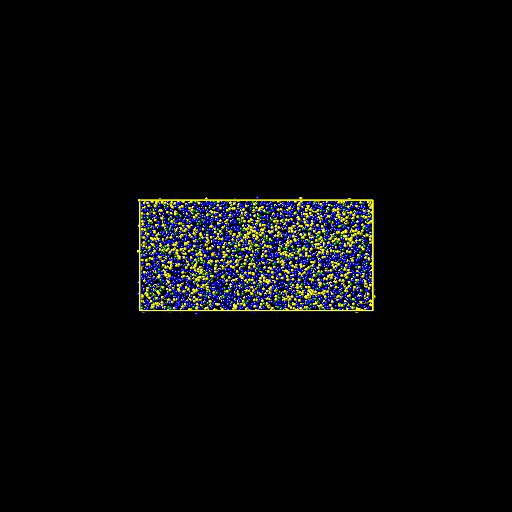

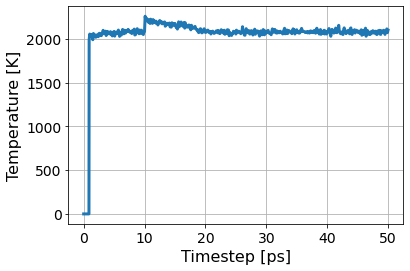

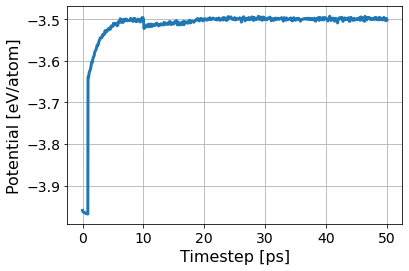

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/20738ac29089442cbc22099701ddd492/inputs.yaml
       RUNS/20738ac29089442cbc22099701ddd492
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/20738ac29089442cbc22099701ddd492/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:03<00:00, 40.92s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/20738ac29089442cbc22099701ddd492/inputs.yaml
       RUNS/20738ac29089442cbc22099701ddd492
Predicted melting temperature for this potential:  1984.4501855721394
95% confidence interval:  2.71981570777359
Fraction of system solid:  0.14127604166666666
Fraction of system liquid:  0.8424479166666666
Simulation Success Flag 0.0
Crystal Structure Info:  [6.510e+02 4.700e+01 1.600e+01 1.100e+01 1.000e+00 3.882e+03 4.608e+03]


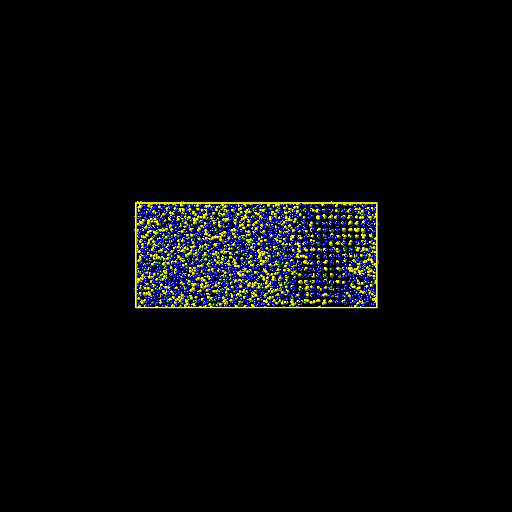

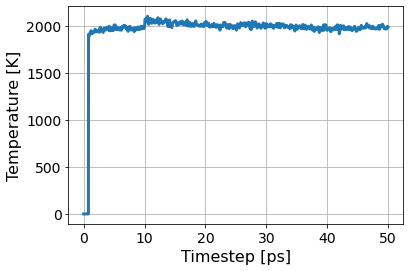

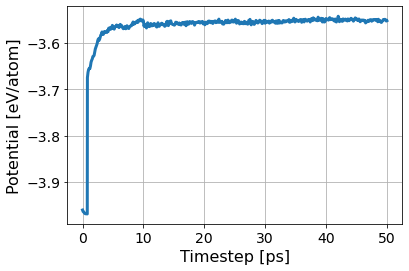

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c53bcdf9a4ec487fb653013847e649c1/inputs.yaml
       RUNS/c53bcdf9a4ec487fb653013847e649c1
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/c53bcdf9a4ec487fb653013847e649c1/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:05<00:00, 41.04s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/c53bcdf9a4ec487fb653013847e649c1/inputs.yaml
       RUNS/c53bcdf9a4ec487fb653013847e649c1
Predicted melting temperature for this potential:  1945.3758139303482
95% confidence interval:  3.37048911716319
Fraction of system solid:  0.3572048611111111
Fraction of system liquid:  0.6267361111111112
Simulation Success Flag 1.0
Crystal Structure Info:  [1.646e+03 4.300e+01 2.300e+01 7.000e+00 1.000e+00 2.888e+03 4.608e+03]


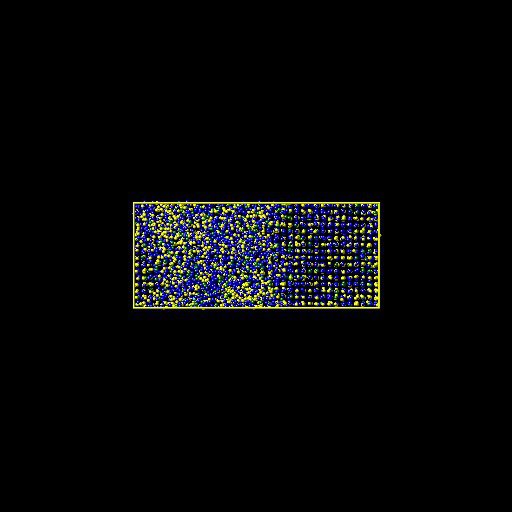

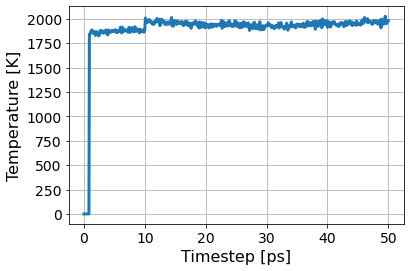

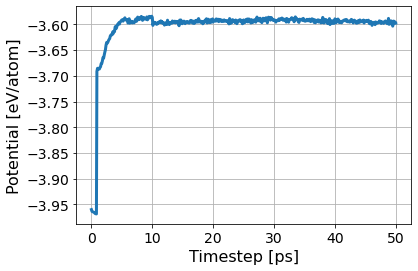

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  10
394
[0.0, 0.3, 0.0, 0.3, 0.4]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b7090b7091224c528055e6663b18f013/inputs.yaml
       RUNS/b7090b7091224c528055e6663b18f013
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/b7090b7091224c528055e6663b18f013/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [28:30<00:00, 68.43s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b7090b7091224c528055e6663b18f013/inputs.yaml
       RUNS/b7090b7091224c528055e6663b18f013
Predicted melting temperature for this potential:  2544.002378606965
95% confidence interval:  3.3153997853153747
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9908854166666666
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.800e+01 1.000e+00 1.700e+01 2.000e+00 4.566e+03 4.608e+03]


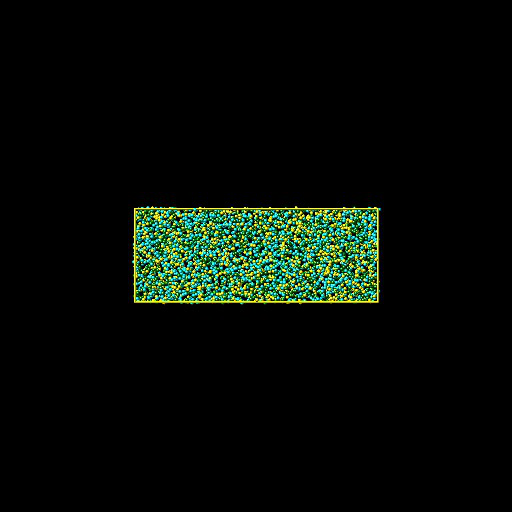

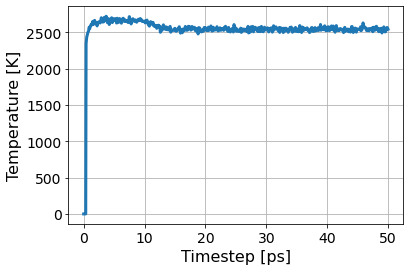

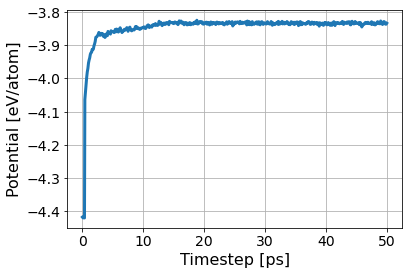

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ec065e6a32134d4c86924f14accc189b/inputs.yaml
       RUNS/ec065e6a32134d4c86924f14accc189b
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/ec065e6a32134d4c86924f14accc189b/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:32<00:00, 42.08s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ec065e6a32134d4c86924f14accc189b/inputs.yaml
       RUNS/ec065e6a32134d4c86924f14accc189b
Predicted melting temperature for this potential:  2359.97422238806
95% confidence interval:  3.3003117296171394
Fraction of system solid:  0.0015190972222222222
Fraction of system liquid:  0.9854600694444444
Simulation Success Flag 0.0
Crystal Structure Info:  [7.000e+00 3.200e+01 1.000e+00 2.500e+01 2.000e+00 4.541e+03 4.608e+03]


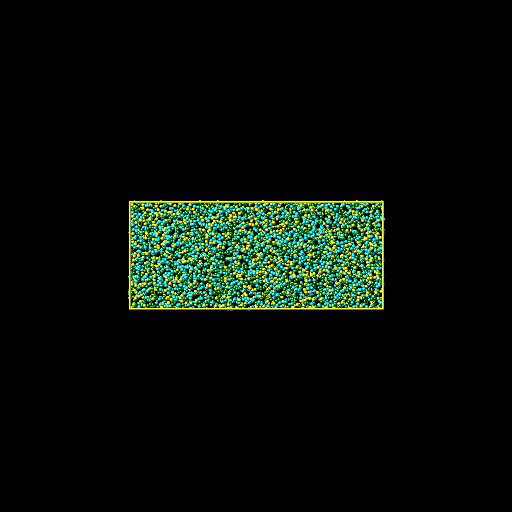

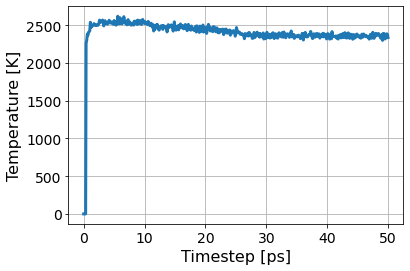

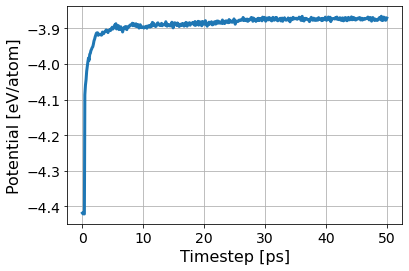

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/776599702f934c35a965d03cff660d64/inputs.yaml
       RUNS/776599702f934c35a965d03cff660d64
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/776599702f934c35a965d03cff660d64/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:55<00:00, 43.00s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/776599702f934c35a965d03cff660d64/inputs.yaml
       RUNS/776599702f934c35a965d03cff660d64
Predicted melting temperature for this potential:  2367.12592039801
95% confidence interval:  3.280847595013678
Fraction of system solid:  0.20030381944444445
Fraction of system liquid:  0.7747395833333334
Simulation Success Flag 0.0
Crystal Structure Info:  [9.230e+02 6.800e+01 3.200e+01 1.400e+01 1.000e+00 3.570e+03 4.608e+03]


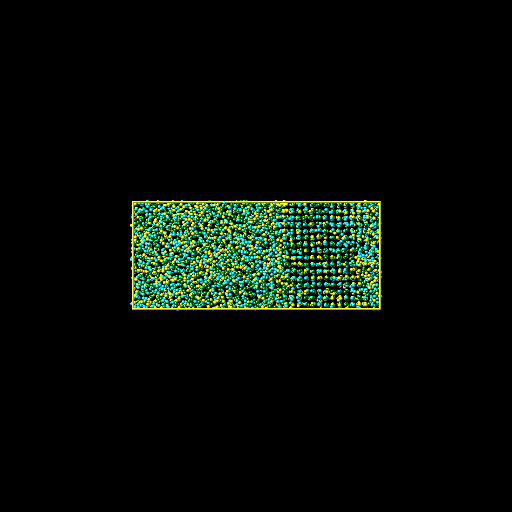

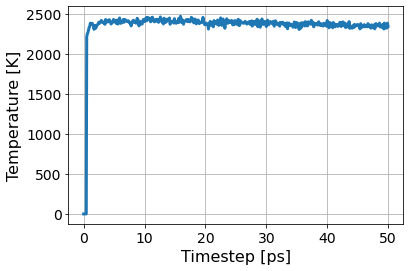

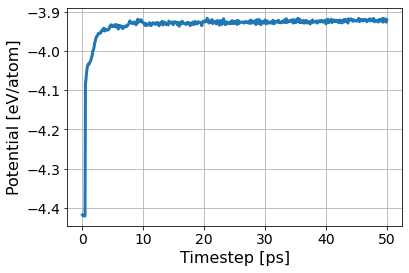

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e653074cd8464322bd3257252d7eecac/inputs.yaml
       RUNS/e653074cd8464322bd3257252d7eecac
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/e653074cd8464322bd3257252d7eecac/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:12<00:00, 43.68s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e653074cd8464322bd3257252d7eecac/inputs.yaml
       RUNS/e653074cd8464322bd3257252d7eecac
Predicted melting temperature for this potential:  2370.16715920398
95% confidence interval:  3.438289472159871
Fraction of system solid:  0.4064670138888889
Fraction of system liquid:  0.568359375
Simulation Success Flag 1.0
Crystal Structure Info:  [1.873e+03 5.700e+01 4.500e+01 1.300e+01 1.000e+00 2.619e+03 4.608e+03]


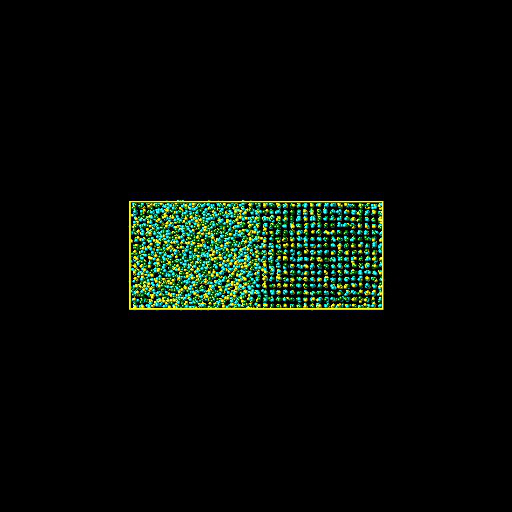

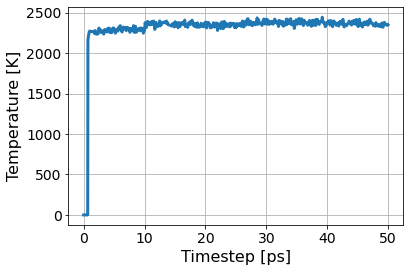

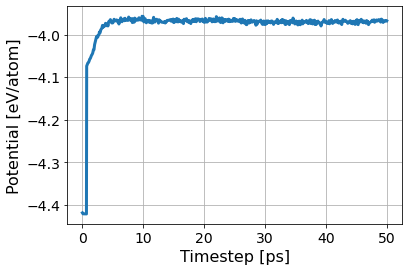

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  11
346
[0.2, 0.2, 0.0, 0.4, 0.2]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ac353805a50d461c802297244e618bb3/inputs.yaml
       RUNS/ac353805a50d461c802297244e618bb3
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/ac353805a50d461c802297244e618bb3/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:04<00:00, 43.36s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ac353805a50d461c802297244e618bb3/inputs.yaml
       RUNS/ac353805a50d461c802297244e618bb3
Predicted melting temperature for this potential:  2518.420034825871
95% confidence interval:  3.1612268068990934
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9908854166666666
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 2.200e+01 1.000e+00 1.400e+01 1.000e+00 4.566e+03 4.608e+03]


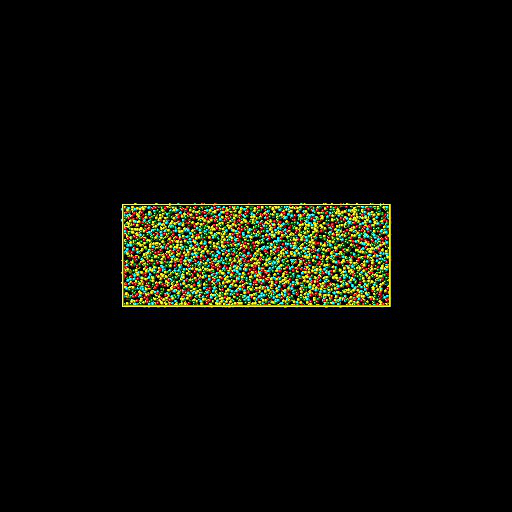

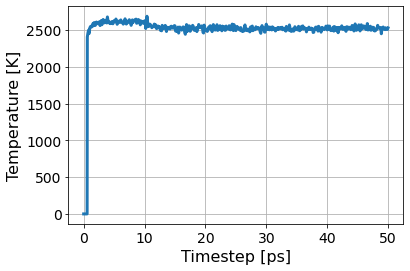

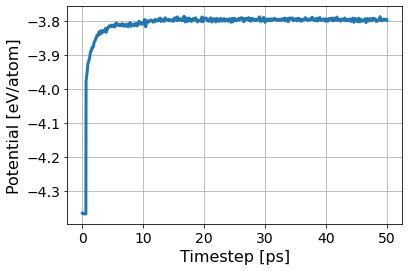

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e562732b883a41e3b0fbc705d7dc5e71/inputs.yaml
       RUNS/e562732b883a41e3b0fbc705d7dc5e71
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/e562732b883a41e3b0fbc705d7dc5e71/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:20<00:00, 44.00s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/e562732b883a41e3b0fbc705d7dc5e71/inputs.yaml
       RUNS/e562732b883a41e3b0fbc705d7dc5e71
Predicted melting temperature for this potential:  2299.953737313433
95% confidence interval:  3.035620901315111
Fraction of system solid:  0.0015190972222222222
Fraction of system liquid:  0.9854600694444444
Simulation Success Flag 0.0
Crystal Structure Info:  [7.000e+00 1.900e+01 0.000e+00 3.900e+01 2.000e+00 4.541e+03 4.608e+03]


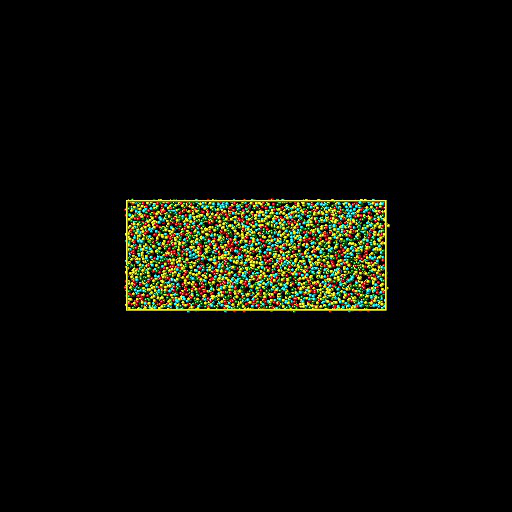

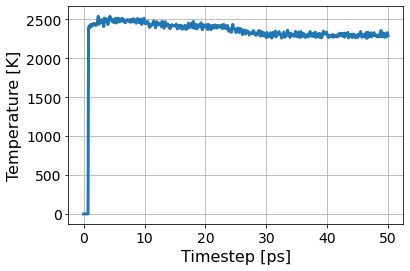

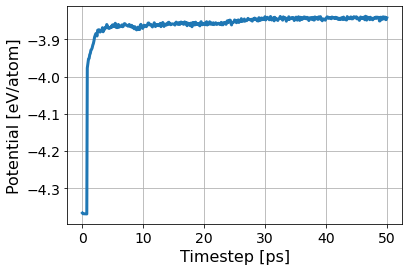

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f579196da5734a3ca97decadc9e73bbd/inputs.yaml
       RUNS/f579196da5734a3ca97decadc9e73bbd
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/f579196da5734a3ca97decadc9e73bbd/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:21<00:00, 44.04s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f579196da5734a3ca97decadc9e73bbd/inputs.yaml
       RUNS/f579196da5734a3ca97decadc9e73bbd
Predicted melting temperature for this potential:  2363.3192601990045
95% confidence interval:  3.3382697180552063
Fraction of system solid:  0.2936197916666667
Fraction of system liquid:  0.6851128472222222
Simulation Success Flag 0.0
Crystal Structure Info:  [1.353e+03 6.000e+01 3.000e+01 7.000e+00 1.000e+00 3.157e+03 4.608e+03]


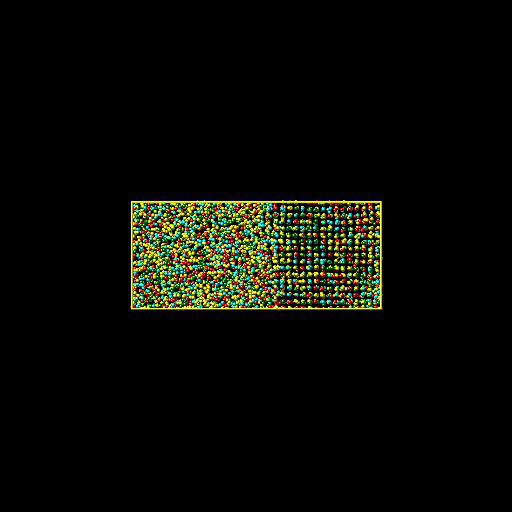

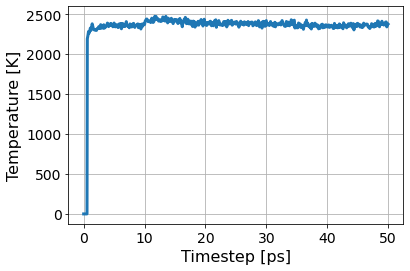

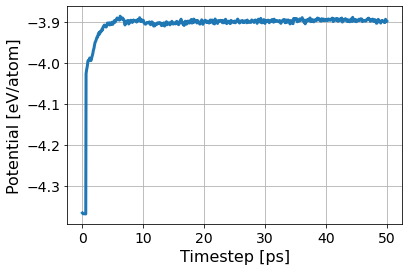

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/75fbff8b6ace48de8df3797506e441e4/inputs.yaml
       RUNS/75fbff8b6ace48de8df3797506e441e4
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/75fbff8b6ace48de8df3797506e441e4/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:29<00:00, 44.36s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/75fbff8b6ace48de8df3797506e441e4/inputs.yaml
       RUNS/75fbff8b6ace48de8df3797506e441e4
Predicted melting temperature for this potential:  2346.257171144279
95% confidence interval:  3.380250401436254
Fraction of system solid:  0.5336371527777778
Fraction of system liquid:  0.4479166666666667
Simulation Success Flag 1.0
Crystal Structure Info:  [2459.   51.   28.    6.    0. 2064. 4608.]


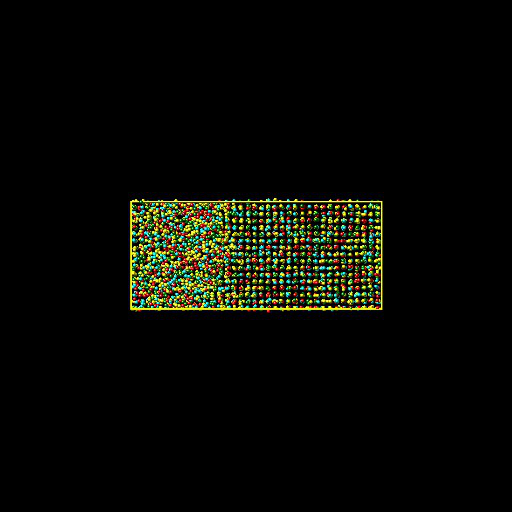

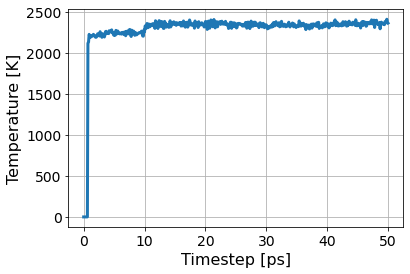

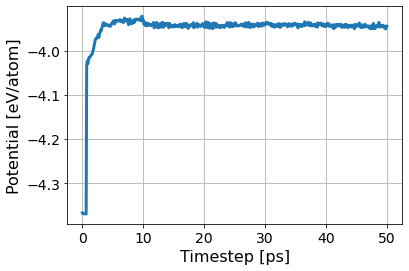

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  12
395
[0.0, 0.3, 0.0, 0.4, 0.3]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/cfcd8cc820a24bc69151c4a5cbc6bf32/inputs.yaml
       RUNS/cfcd8cc820a24bc69151c4a5cbc6bf32
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/cfcd8cc820a24bc69151c4a5cbc6bf32/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:24<00:00, 41.76s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/cfcd8cc820a24bc69151c4a5cbc6bf32/inputs.yaml
       RUNS/cfcd8cc820a24bc69151c4a5cbc6bf32
Predicted melting temperature for this potential:  2598.718245273632
95% confidence interval:  3.0074413424823168
Fraction of system solid:  0.0
Fraction of system liquid:  0.9917534722222222
Simulation Success Flag 0.0
Crystal Structure Info:  [0.000e+00 1.600e+01 3.000e+00 1.800e+01 1.000e+00 4.570e+03 4.608e+03]


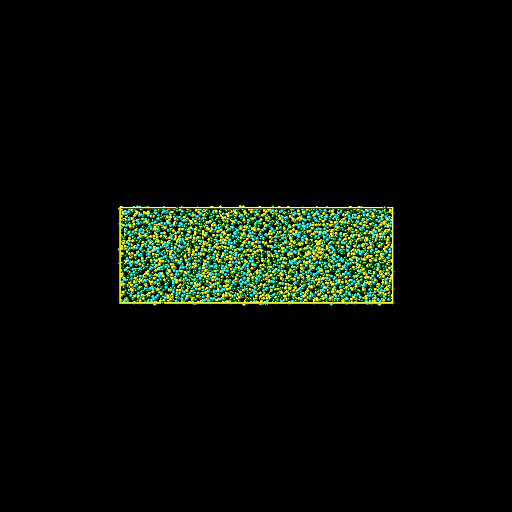

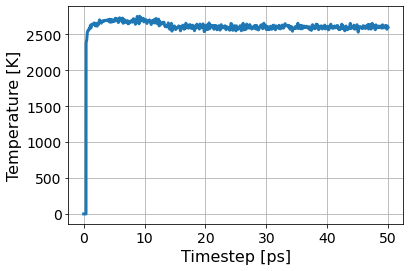

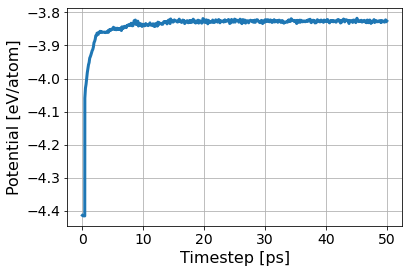

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/0e22f36a26144b26a0ab78997e9cdc1d/inputs.yaml
       RUNS/0e22f36a26144b26a0ab78997e9cdc1d
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/0e22f36a26144b26a0ab78997e9cdc1d/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:36<00:00, 42.24s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/0e22f36a26144b26a0ab78997e9cdc1d/inputs.yaml
       RUNS/0e22f36a26144b26a0ab78997e9cdc1d
Predicted melting temperature for this potential:  2414.5694253731344
95% confidence interval:  3.4261861929809396
Fraction of system solid:  0.001953125
Fraction of system liquid:  0.9900173611111112
Simulation Success Flag 0.0
Crystal Structure Info:  [9.000e+00 1.700e+01 2.000e+00 1.700e+01 1.000e+00 4.562e+03 4.608e+03]


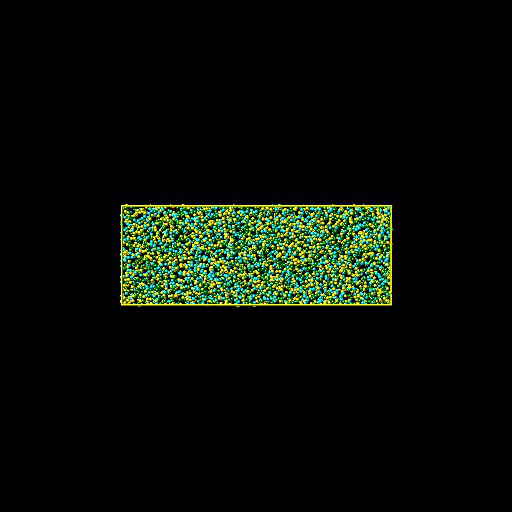

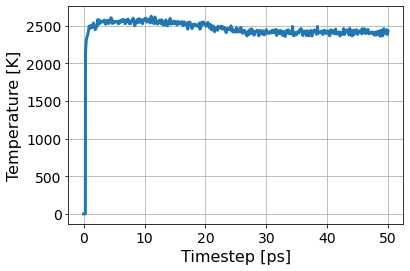

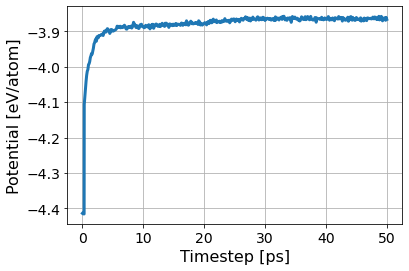

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f5fe337cff7f4041aebcd64bce93396d/inputs.yaml
       RUNS/f5fe337cff7f4041aebcd64bce93396d
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/f5fe337cff7f4041aebcd64bce93396d/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:45<00:00, 42.60s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f5fe337cff7f4041aebcd64bce93396d/inputs.yaml
       RUNS/f5fe337cff7f4041aebcd64bce93396d
Predicted melting temperature for this potential:  2468.1324766169155
95% confidence interval:  3.3101961508294058
Fraction of system solid:  0.3240017361111111
Fraction of system liquid:  0.6566840277777778
Simulation Success Flag 0.0
Crystal Structure Info:  [1493.   56.   23.   10.    0. 3026. 4608.]


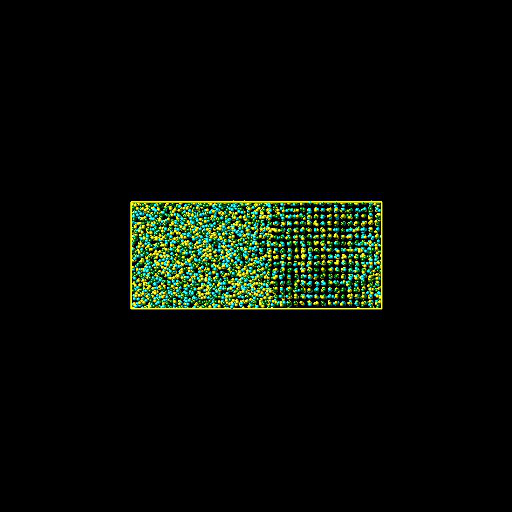

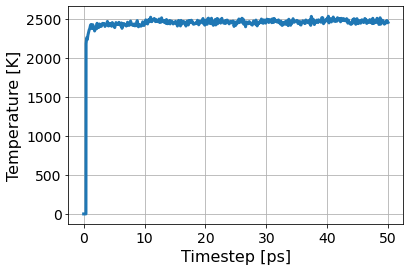

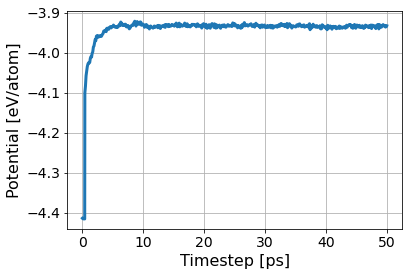

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/12af892ae609404d9e979390ba34e625/inputs.yaml
       RUNS/12af892ae609404d9e979390ba34e625
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/12af892ae609404d9e979390ba34e625/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:48<00:00, 42.73s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/12af892ae609404d9e979390ba34e625/inputs.yaml
       RUNS/12af892ae609404d9e979390ba34e625
Predicted melting temperature for this potential:  2398.1141328358212
95% confidence interval:  3.459104702513815
Fraction of system solid:  0.4848090277777778
Fraction of system liquid:  0.4945746527777778
Simulation Success Flag 1.0
Crystal Structure Info:  [2.234e+03 4.900e+01 3.300e+01 1.100e+01 2.000e+00 2.279e+03 4.608e+03]


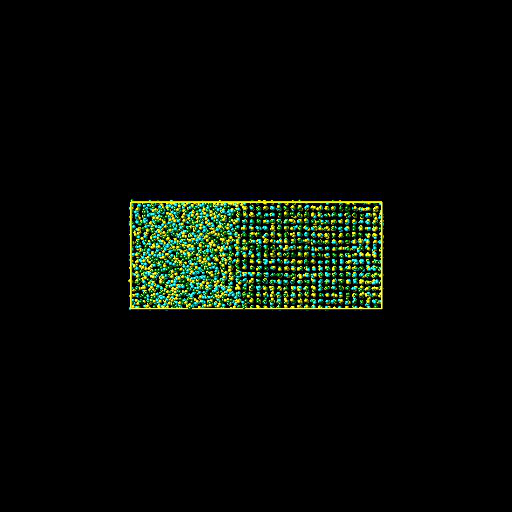

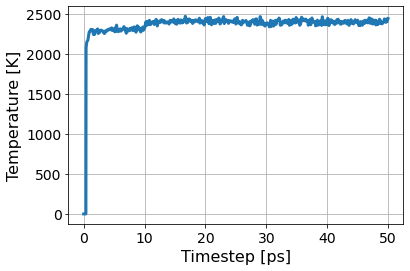

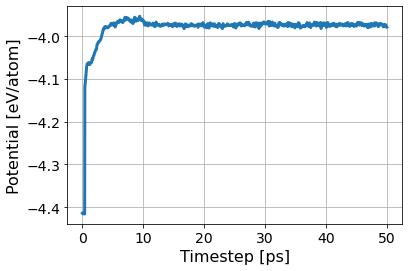

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  13
347
[0.2, 0.2, 0.0, 0.5, 0.1]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/116776eca7bc4bfab5081354436f0915/inputs.yaml
       RUNS/116776eca7bc4bfab5081354436f0915
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/116776eca7bc4bfab5081354436f0915/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:58<00:00, 43.12s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/116776eca7bc4bfab5081354436f0915/inputs.yaml
       RUNS/116776eca7bc4bfab5081354436f0915
Predicted melting temperature for this potential:  2661.341017910447
95% confidence interval:  3.517148881500116
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9934895833333334
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.400e+01 0.000e+00 1.000e+01 2.000e+00 4.578e+03 4.608e+03]


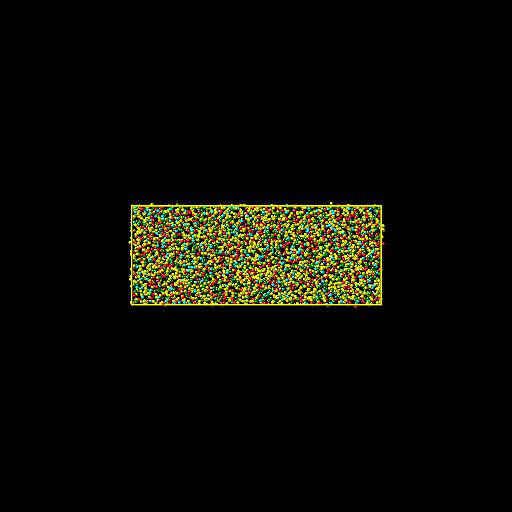

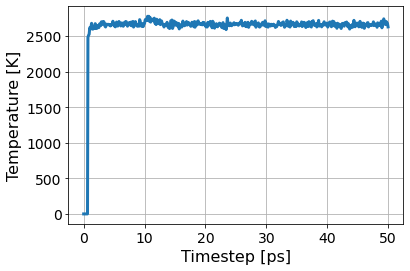

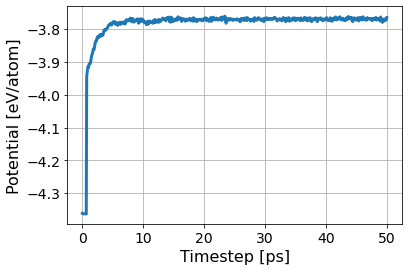

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/5c230d3e1e144633a29ecd72ab823b97/inputs.yaml
       RUNS/5c230d3e1e144633a29ecd72ab823b97
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/5c230d3e1e144633a29ecd72ab823b97/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:00<00:00, 43.20s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/5c230d3e1e144633a29ecd72ab823b97/inputs.yaml
       RUNS/5c230d3e1e144633a29ecd72ab823b97
Predicted melting temperature for this potential:  2484.126351243781
95% confidence interval:  3.244628130287302
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9880642361111112
Simulation Success Flag 0.0
Crystal Structure Info:  [   6.   25.    5.   19.    0. 4553. 4608.]


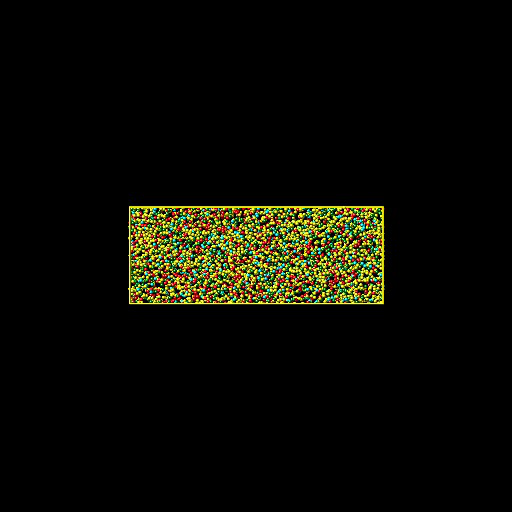

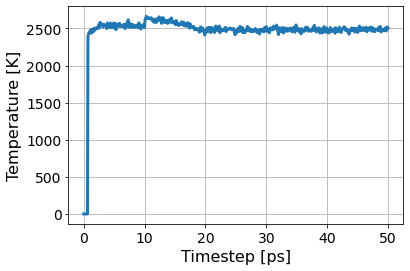

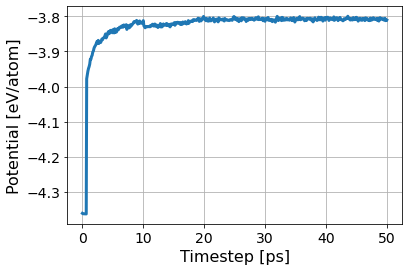

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/bc41bf1924fd4759b4f58dce14bc290b/inputs.yaml
       RUNS/bc41bf1924fd4759b4f58dce14bc290b
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/bc41bf1924fd4759b4f58dce14bc290b/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:13<00:00, 43.72s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/bc41bf1924fd4759b4f58dce14bc290b/inputs.yaml
       RUNS/bc41bf1924fd4759b4f58dce14bc290b
Predicted melting temperature for this potential:  2394.924375124378
95% confidence interval:  3.0966405580037324
Fraction of system solid:  0.1918402777777778
Fraction of system liquid:  0.7779947916666666
Simulation Success Flag 0.0
Crystal Structure Info:  [8.840e+02 8.900e+01 3.500e+01 1.300e+01 2.000e+00 3.585e+03 4.608e+03]


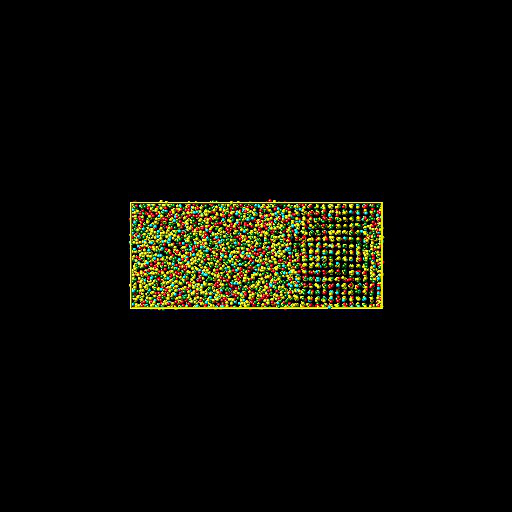

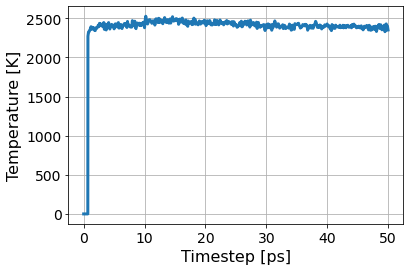

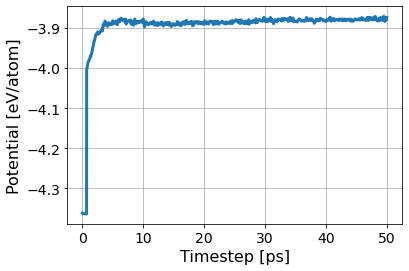

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b4488e27880641209d1d534587548191/inputs.yaml
       RUNS/b4488e27880641209d1d534587548191
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/b4488e27880641209d1d534587548191/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:09<00:00, 43.60s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b4488e27880641209d1d534587548191/inputs.yaml
       RUNS/b4488e27880641209d1d534587548191
Predicted melting temperature for this potential:  2406.2615467661694
95% confidence interval:  3.7365192867763124
Fraction of system solid:  0.5141059027777778
Fraction of system liquid:  0.4592013888888889
Simulation Success Flag 1.0
Crystal Structure Info:  [2369.   80.   37.    6.    0. 2116. 4608.]


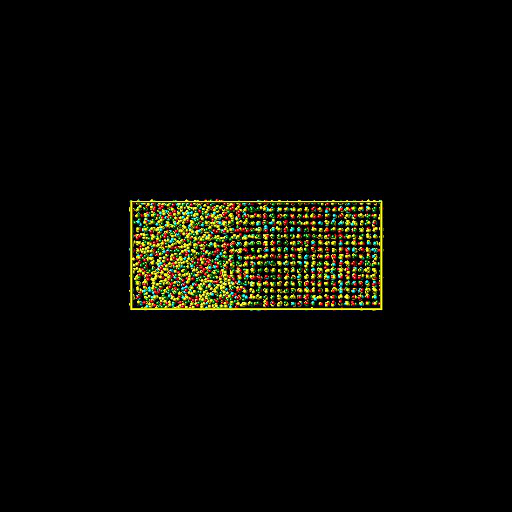

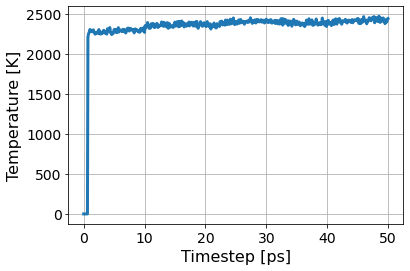

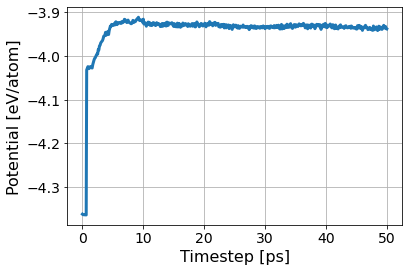

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  14
324
[0.1, 0.2, 0.0, 0.3, 0.4]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/fb9d7465d2e34931b0c8d314994ceaa2/inputs.yaml
       RUNS/fb9d7465d2e34931b0c8d314994ceaa2
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/fb9d7465d2e34931b0c8d314994ceaa2/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:04<00:00, 43.40s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/fb9d7465d2e34931b0c8d314994ceaa2/inputs.yaml
       RUNS/fb9d7465d2e34931b0c8d314994ceaa2
Predicted melting temperature for this potential:  2430.800836318408
95% confidence interval:  3.3686879890817547
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9908854166666666
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 1.300e+01 0.000e+00 2.400e+01 1.000e+00 4.566e+03 4.608e+03]


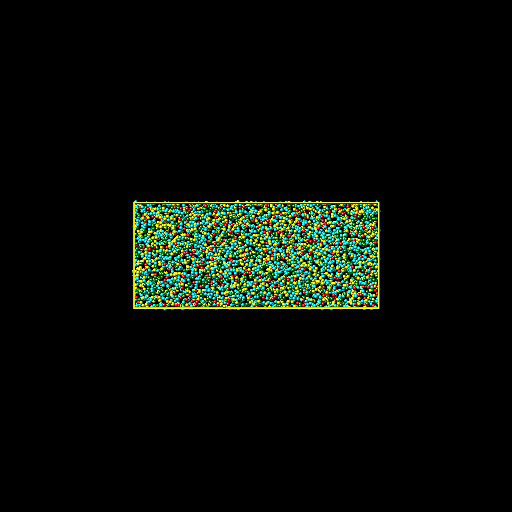

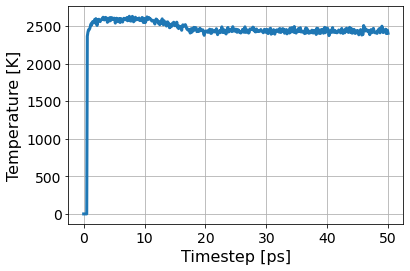

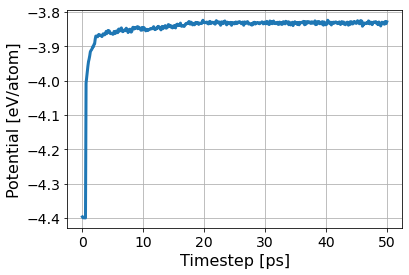

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/37852cd94ea34b3f969a2dd0c2d7762b/inputs.yaml
       RUNS/37852cd94ea34b3f969a2dd0c2d7762b
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/37852cd94ea34b3f969a2dd0c2d7762b/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:21<00:00, 44.04s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/37852cd94ea34b3f969a2dd0c2d7762b/inputs.yaml
       RUNS/37852cd94ea34b3f969a2dd0c2d7762b
Predicted melting temperature for this potential:  2305.2627482587063
95% confidence interval:  5.6360168382157925
Fraction of system solid:  0.0010850694444444445
Fraction of system liquid:  0.9867621527777778
Simulation Success Flag 0.0
Crystal Structure Info:  [5.000e+00 2.800e+01 1.000e+00 2.700e+01 0.000e+00 4.547e+03 4.608e+03]


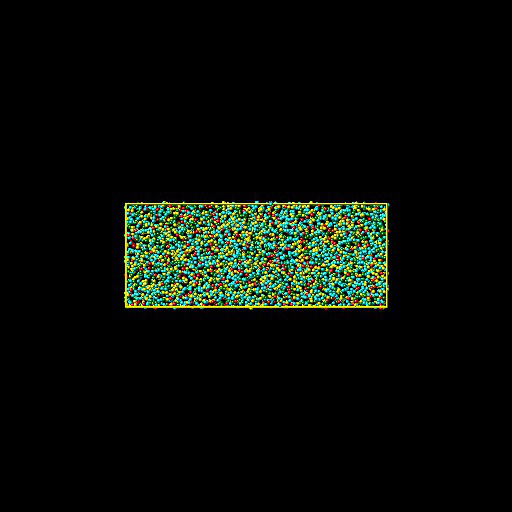

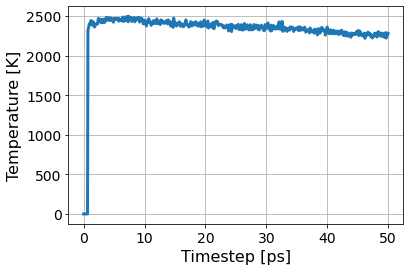

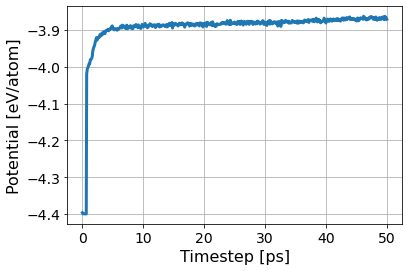

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ff3b816b8e2c449c960b8fe7e8ca84ca/inputs.yaml
       RUNS/ff3b816b8e2c449c960b8fe7e8ca84ca
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/ff3b816b8e2c449c960b8fe7e8ca84ca/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:28<00:00, 44.32s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/ff3b816b8e2c449c960b8fe7e8ca84ca/inputs.yaml
       RUNS/ff3b816b8e2c449c960b8fe7e8ca84ca
Predicted melting temperature for this potential:  2333.791010447761
95% confidence interval:  3.4210394313441546
Fraction of system solid:  0.337890625
Fraction of system liquid:  0.6438802083333334
Simulation Success Flag 0.0
Crystal Structure Info:  [1.557e+03 5.600e+01 1.500e+01 1.200e+01 1.000e+00 2.967e+03 4.608e+03]


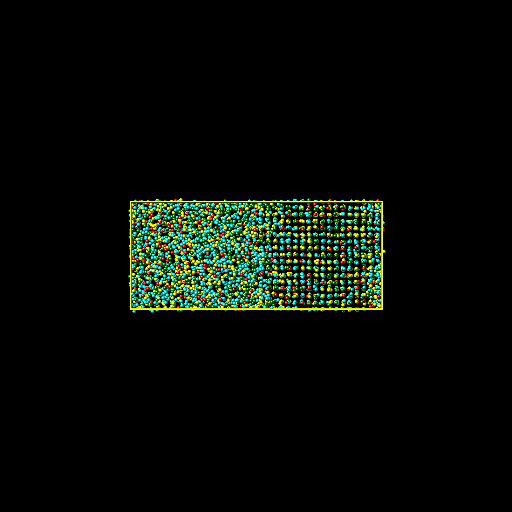

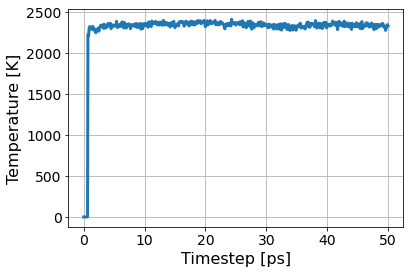

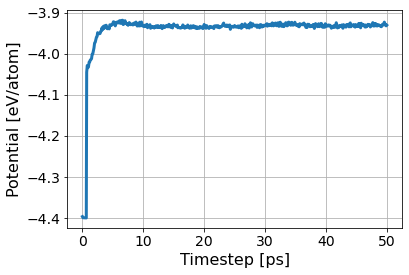

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a3193c2352654f5a93f2d911d7f2dd1d/inputs.yaml
       RUNS/a3193c2352654f5a93f2d911d7f2dd1d
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/a3193c2352654f5a93f2d911d7f2dd1d/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:22<00:00, 44.12s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a3193c2352654f5a93f2d911d7f2dd1d/inputs.yaml
       RUNS/a3193c2352654f5a93f2d911d7f2dd1d
Predicted melting temperature for this potential:  2317.972776119403
95% confidence interval:  3.4402867078932244
Fraction of system solid:  0.4524739583333333
Fraction of system liquid:  0.5269097222222222
Simulation Success Flag 1.0
Crystal Structure Info:  [2.085e+03 5.800e+01 3.000e+01 6.000e+00 1.000e+00 2.428e+03 4.608e+03]


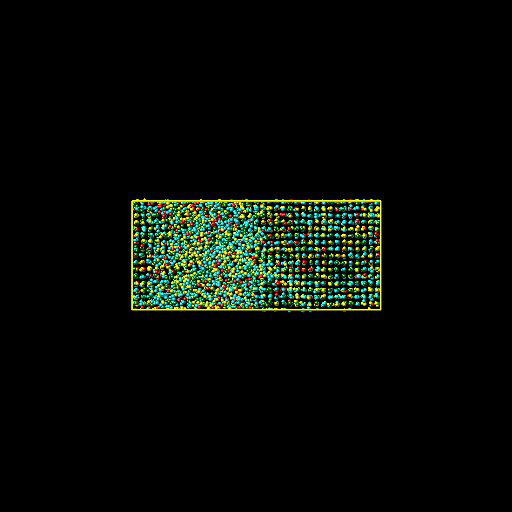

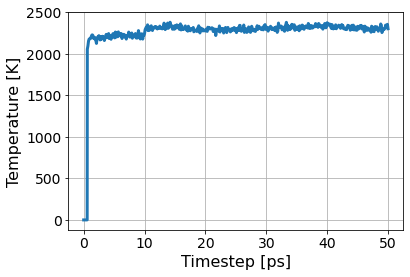

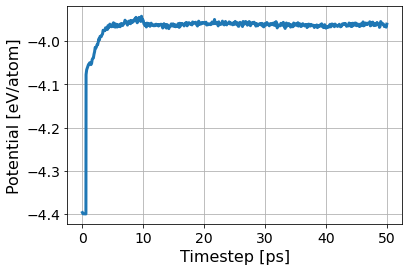

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  15
233
[0.2, 0.1, 0.1, 0.5, 0.1]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f9ed87b31b3f40408fcab0970d8b2e5a/inputs.yaml
       RUNS/f9ed87b31b3f40408fcab0970d8b2e5a
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/f9ed87b31b3f40408fcab0970d8b2e5a/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:14<00:00, 43.76s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/f9ed87b31b3f40408fcab0970d8b2e5a/inputs.yaml
       RUNS/f9ed87b31b3f40408fcab0970d8b2e5a
Predicted melting temperature for this potential:  2662.0283850746273
95% confidence interval:  3.4124736605908694
Fraction of system solid:  0.00043402777777777775
Fraction of system liquid:  0.9939236111111112
Simulation Success Flag 0.0
Crystal Structure Info:  [2.000e+00 7.000e+00 0.000e+00 1.400e+01 5.000e+00 4.580e+03 4.608e+03]


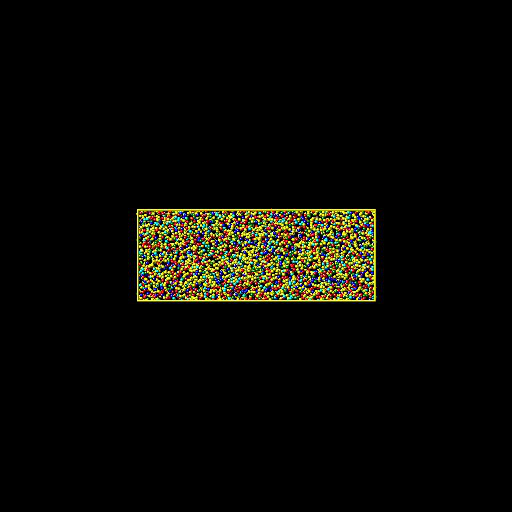

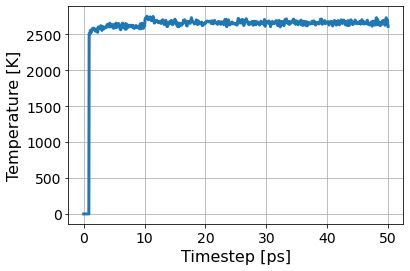

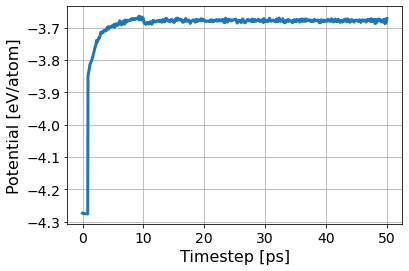

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/79698231b432409f891ee15c62c33769/inputs.yaml
       RUNS/79698231b432409f891ee15c62c33769
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/79698231b432409f891ee15c62c33769/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:21<00:00, 44.04s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/79698231b432409f891ee15c62c33769/inputs.yaml
       RUNS/79698231b432409f891ee15c62c33769
Predicted melting temperature for this potential:  2487.3607343283584
95% confidence interval:  2.9444068248534125
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.990234375
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 2.100e+01 1.000e+00 1.900e+01 0.000e+00 4.563e+03 4.608e+03]


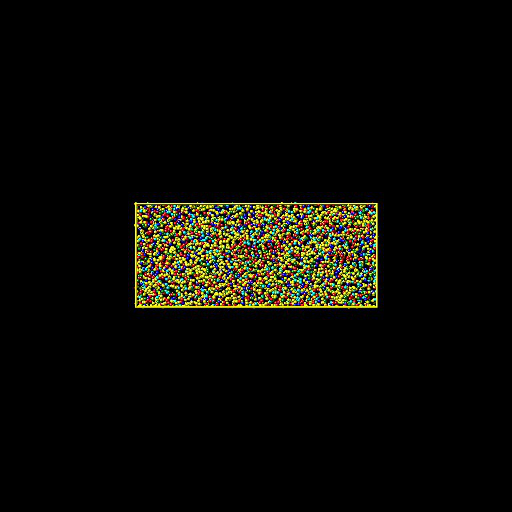

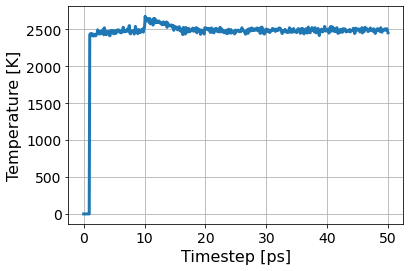

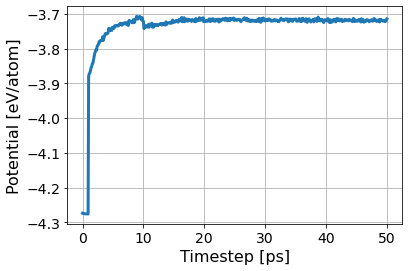

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b455cdd0169c40a583a4fed6b504a958/inputs.yaml
       RUNS/b455cdd0169c40a583a4fed6b504a958
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/b455cdd0169c40a583a4fed6b504a958/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:32<00:00, 44.48s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/b455cdd0169c40a583a4fed6b504a958/inputs.yaml
       RUNS/b455cdd0169c40a583a4fed6b504a958
Predicted melting temperature for this potential:  2265.0185253731343
95% confidence interval:  3.1513370379301575
Fraction of system solid:  0.0008680555555555555
Fraction of system liquid:  0.9867621527777778
Simulation Success Flag 0.0
Crystal Structure Info:  [4.000e+00 3.200e+01 1.000e+00 2.400e+01 0.000e+00 4.547e+03 4.608e+03]


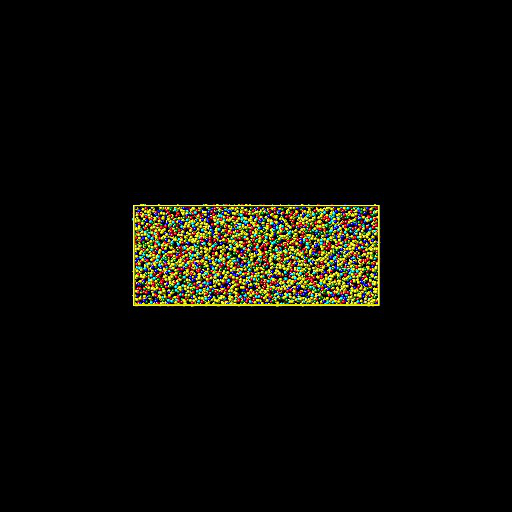

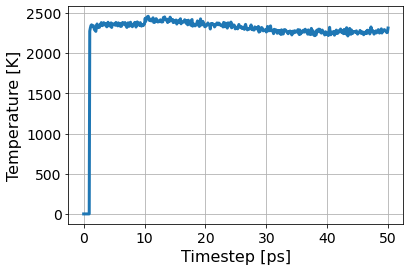

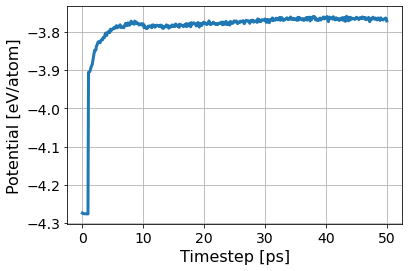

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6255ef77acef40359d5156045c3608a6/inputs.yaml
       RUNS/6255ef77acef40359d5156045c3608a6
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/6255ef77acef40359d5156045c3608a6/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [18:51<00:00, 45.24s/cell]   


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/6255ef77acef40359d5156045c3608a6/inputs.yaml
       RUNS/6255ef77acef40359d5156045c3608a6
Predicted melting temperature for this potential:  2314.3886830845768
95% confidence interval:  3.5669628467877175
Fraction of system solid:  0.4290364583333333
Fraction of system liquid:  0.5525173611111112
Simulation Success Flag 1.0
Crystal Structure Info:  [1977.   47.   32.    6.    0. 2546. 4608.]


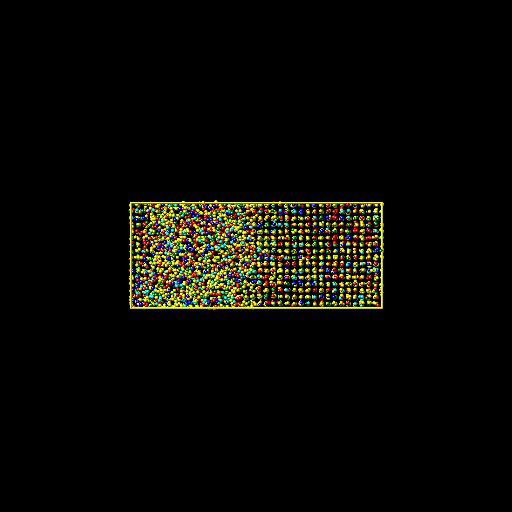

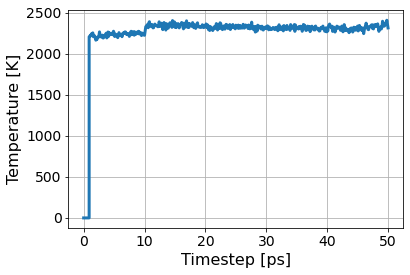

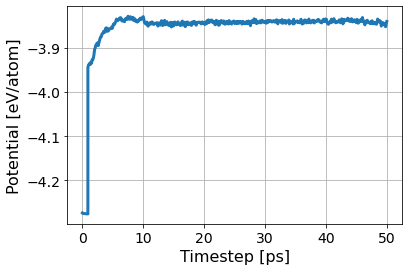

/apps/share64/debian7/anaconda/anaconda-6/lib/python3.7/site-packages/pandas/core/frame.py:6692: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




-------------------------------------------------------------
Experiment #  16
546
[0.0, 0.5, 0.0, 0.3, 0.2]
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4c15dd6cc4e64bb2acf43722600f1464/inputs.yaml
       RUNS/4c15dd6cc4e64bb2acf43722600f1464
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/4c15dd6cc4e64bb2acf43722600f1464/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing: 100%|??????????| 25/25 [17:37<00:00, 42.32s/cell] 


Saved output files: ['final.jpg']
simToolSaveErrorOccurred = 0
simToolAllOutputsSaved = 1
submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/4c15dd6cc4e64bb2acf43722600f1464/inputs.yaml
       RUNS/4c15dd6cc4e64bb2acf43722600f1464
Predicted melting temperature for this potential:  2542.0728835820896
95% confidence interval:  3.4294762296102066
Fraction of system solid:  0.0013020833333333333
Fraction of system liquid:  0.9884982638888888
Simulation Success Flag 0.0
Crystal Structure Info:  [6.000e+00 2.600e+01 1.000e+00 1.800e+01 2.000e+00 4.555e+03 4.608e+03]


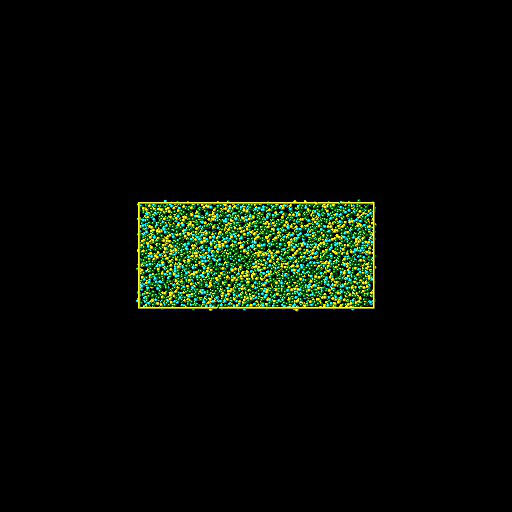

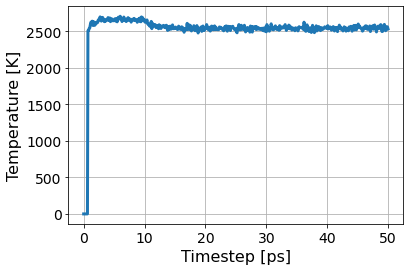

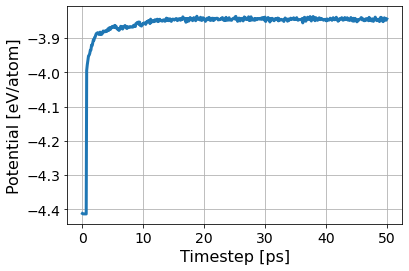

submit --local /apps/bin/ionhelperGetSimToolResult.sh meltheas r27
       RUNS/a09577038f1d4f8f8f8ceef4128f7c18/inputs.yaml
       RUNS/a09577038f1d4f8f8f8ceef4128f7c18
submit --local /apps/bin/ionhelperRunSimTool.sh meltheas r27
       RUNS/a09577038f1d4f8f8f8ceef4128f7c18/inputs.yaml


Input Notebook:  /apps/meltheas/r27/simtool/meltheas.ipynb
Output Notebook: meltheas.ipynb
Executing:  52%|??????    | 13/25 [00:20<00:09,  1.31cell/s]

In [ ]:
n_steps = 40 #number of expirements
all_inds = set(range(len(y))) #set indexes
actaul_exp = np.sum(in_train)-len(initial_data)
gif_images = [] #list to save gifs as 2D array

history_train = [list(set(np.where(in_train)[0].tolist()))]
current_train_inds = []
#reset_comps = all_compositions.reset_index(drop=True)

#Create dataframe to save values to make into excel
saved_data = pd.DataFrame(columns=['IAF','Composition','Experiment',"Simulated Tm","Predicted Tm","Predicted Uncertainty","T_Solid","T_Liquid","Index"])
df2 = pd.DataFrame(columns = sample)

patience_counter = 0

print(len(history_train[-1]))

for i in range(n_steps):

    print("-------------------------------------------------------------")
    print("Experiment # ", i)
    
    current_train_inds = history_train[-1].copy()

    current_search_inds = list(all_inds.difference(current_train_inds))
    
    #Random Forest fitting and predicting
    model.fit(X[current_train_inds], y[current_train_inds]) #train model, with entry_number
    current_y_pred, current_y_std = model.predict(X[current_search_inds], return_std=True) #pred

    # ACQUISITION FUNCTIONS
    
    # EARLY STOPPING / ACQUISITION
    
    iaf = "MLI"
    
    if iaf == "MEI":
    
        index_of_prediction = np.argmax(current_y_pred)    # MEI   
        
        if np.max(current_y_pred) < np.max(y[current_train_inds]):
            patience_counter +=1
        else:
            patience_counter = 0
    
    elif iaf == "UCB":
        
        index_of_prediction = np.argmax([sum(x) for x in zip(current_y_pred, current_y_std)]) # UCB     
        
        if np.max([sum(x) for x in zip(current_y_pred, current_y_std)]) < np.max(y[current_train_inds]):
            patience_counter +=1
        else:
            patience_counter = 0        
    
    elif iaf == "MLI":
    
        index_of_prediction = np.argmax(np.divide(current_y_pred - np.max(y[current_train_inds]), current_y_std)) # MLI
    
        if np.max(current_y_pred) < np.max(y[current_train_inds]):
            patience_counter +=1
        else:
            patience_counter = 0
    
    
    elif iaf == "MU":
        
        index_of_prediction = np.argmax(current_y_std) # MU
        
        if np.max(current_y_std) < 50:
            patience_counter +=1
        else:
            patience_counter = 0
        
        
    else:
        index_of_prediction = np.random.choice(current_search_inds)           # Random    
    
#     if patience_counter > 15:
#         print("Early Stop")
#         break
        
    chosen_index_forsimul = current_search_inds[index_of_prediction]    
    composition_forsimul = all_compositions.iloc[chosen_index_forsimul] #compositions for simulation
    
    #printing index and compistion
    print(chosen_index_forsimul)
    print(list(composition_forsimul))

    # RUNNING MELTHEAS SIM

    # setting inputs
    sim_gif = []
    flag = False
    plus = 0.50
    minus = 0.25    
    iteration = 0
    
    T_ROM = current_y_pred[index_of_prediction]    
    
    while (flag == False):
        inputs = getSimToolInputs(MeltHEA)
        
        random_seed = int(np.random.randint(1,10000,1)[0])
        velocity_seed = int(np.random.randint(1,10000,1)[0])
        
        inputs.rand_seed.value = random_seed
        inputs.velocity_seed.value = velocity_seed
                
        inputs.time.value = 50000
        inputs.box_length.value = 18
        c1, c2, c3, c4, c5 = list(composition_forsimul)
        inputs.composition1.value = c1
        inputs.composition2.value = c2
        inputs.composition3.value = c3
        inputs.composition4.value = c4
        inputs.composition5.value = c5
        
        inputs.Tsolid.value = (T_ROM-(T_ROM*minus))
        inputs.Tliquid.value = (T_ROM+(T_ROM*plus))

        # running and outputs 
        r = Run(MeltHEA, inputs)

        melting_temperature_obtained = r.read('melting_temperature')
        flag = r.read('successful')
        fraction_solid = r.read('fraction_solid')
        fraction_liquid = r.read('fraction_liquid')
        sim_gif.append(r.read('final_snapshot'))

        print ("Predicted melting temperature for this potential: ", (r.read('melting_temperature')))
        print ("95% confidence interval: ", (r.read('melting_temperature_ci')))
        print ("Fraction of system solid: ", (r.read('fraction_solid')))
        print ("Fraction of system liquid: ", (r.read('fraction_liquid')))
        print ("Simulation Success Flag", (r.read('successful')))
        print ('Crystal Structure Info: ', r.read('counts_array'))
        display(r.read('final_snapshot'))

        if (flag == False):
            if fraction_solid >= fraction_liquid:
                T_ROM += T_ROM*.05 #~80
            elif fraction_liquid >= fraction_solid:
                T_ROM -= T_ROM*.05 #~80
                
         #Graph from the melting workflow
        import matplotlib.pyplot as plt
        #Total number of atoms for 8x8 BCC unit cell cross-section and user input box-length
        if inputs.crystal_structure.value == 'bcc':
            atom_count = 8*8*2*inputs.box_length.value

        #Total number of atoms for 8x8 FCC unit cell cross-section and user input box-length
        elif inputs.crystal_structure.value == 'fcc':
            atom_count = 8*8*4*inputs.box_length.value

        ts = r.read('time_series')

        temperature = r.read('temperature_series')
        plt.plot((ts/1000),temperature,linewidth=3)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.xlabel('Timestep [ps]',fontsize=16)
        plt.ylabel('Temperature [K]',fontsize=16)
        plt.grid()
        plt.show()

        potential_energy = r.read('potential_energy_series')
        plt.plot((ts/1000),np.divide(potential_energy,atom_count),linewidth=3)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.xlabel('Timestep [ps]',fontsize=16)
        plt.ylabel('Potential [eV/atom]',fontsize=16)
        plt.grid()
        plt.show() 

    y[chosen_index_forsimul] = melting_temperature_obtained
    
    #Ending when desired temp found
    if melting_temperature_obtained > 2600:
        continue

    current_train_inds.append(chosen_index_forsimul) #from inputs choosing untrained indexes randomly
    history_train.append(current_train_inds) #storage list, of sets of values created throughout sequential learning
    
    composition_string = " ".join([i + ' ' + str(j) for i, j in zip(["Cr","Co","Cu","Fe","Ni"], composition_forsimul)])
    
    T_Solid = inputs.Tsolid.value
    T_Liquid = inputs.Tliquid.value
    
    
    #Creating dataframe for Animation
    data = pd.DataFrame([iaf,composition_string, actaul_exp, melting_temperature_obtained, current_y_pred[index_of_prediction],
                         current_y_std[index_of_prediction], T_Solid, T_Liquid,chosen_index_forsimul, random_seed, velocity_seed])
    data = data.T
    data = data.rename(columns = {0:'IAF', 1:'Composition',2:'Experiment',3: "Simulated Tm",4: "Predicted Tm",5:"Predicted Uncertainty",6:"T_Solid",7:"T_Liquid",8:"Index", 9:"RandomSeed", 10:"VelocitySeed"})
    saved_data = saved_data.append(data)
    actaul_exp = actaul_exp + 1
    
    #Saving Information into file
    files_to_saved_data = saved_data
    if list_seq_learn:
        files_to_saved_data = saved_data.append(seq_learn_data)
    files_to_saved_data = files_to_saved_data.sort_values(by='Experiment')
    
    csv_file_name2 = '{0}_melting_8labels50pico{1}.csv'.format(iaf,len(list_seq_learn))
    files_to_saved_data.to_csv(csv_file_name2, index = False)
    
    #Getting Images for Gif
    gif_images.append(sim_gif)
    

In [ ]:
display(saved_data)

# Save Runs Into CSV

In [ ]:
if list_seq_learn:
    saved_data = saved_data.append(seq_learn_data)
saved_data = saved_data.sort_values(by='Experiment')
display(saved_data)

In [ ]:
csv_file_name2 = '{0}_melting_8labels50pico{1}.csv'.format(iaf,len(list_seq_learn))
saved_data.to_csv(csv_file_name2, index = False)